# Telecom Churn Case Study

### Problem Statement

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.
For many incumbent operators, retaining high profitable customers is the number one business goal.

To reduce customer churn, telecom companies need to predict which customers are at high risk of churn.

We need to analyse customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn and identify the main indicators of churn.

### Understanding and Defining Churn

There are two main models of payment in the telecom industry - <b>postpaid</b> (customers pay a monthly/annual bill after using the services) and <b>prepaid</b>(customers pay/recharge with a certain amount in advance and then use the services).

In the postpaid model, when customers want to switch to another operator, they usually inform the existing operator to terminate the services, and you directly know that this is an instance of churn.

However, in the prepaid model, customers who want to switch to another network can simply stop using the services without any notice, and it is hard to know whether someone has actually churned or is simply not using the services temporarily (e.g. someone may be on a trip abroad for a month or two and then intend to resume using the services again).

Thus, churn prediction is usually more critical (and non-trivial) for prepaid customers, and the term ‘churn’ should be defined carefully.  Also, prepaid is the most common model in India and southeast Asia, while postpaid is more common in Europe in North America.

This project is based on the Indian and Southeast Asian market.


### Definitions of Churn

This project is based on the usage-based churn which is defined as below :

<b>Usage-based churn</b>: Customers who have not done any usage, either incoming or outgoing - in terms of calls, internet etc. over a period of time.

A potential shortcoming of this definition is that when the customer has stopped using the services for a while, it may be too late to take any corrective actions to retain them. For e.g., if you define churn based on a ‘two-months zero usage’ period, predicting churn could be useless since by that time the customer would have already switched to another operator.


### High-value Churn

In the Indian and the southeast Asian market, approximately 80% of revenue comes from the top 20% customers (called high-value customers). Thus, if we can reduce churn of the high-value customers, we will be able to reduce significant revenue leakage.

In this project, high-value customers based on a below definition : 

Those who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months (the good phase).

<b>Note : It is required to predict churn only on high-value customers.</b>

# How we proceeded with the Case : A brief

As usual, we started the case with basic inspection of the data and found most of the data was related to the functions performed by a telecom customer.
Majority data was numeric and was related to calls or recharges by the customer over the months of Jun-14, Jul-14, Aug-14 and Sep-14.
Some dates were also present in the data. After initial inspection of the data, each and every variable data set for the months was taken and new set of variables were prepared from this.
The data for the months of Jun-14 and Jul-14 was either added or mean or max (based on data) was taken into a new variable that represent `good_phase` (along with data cleaning).
The data for the moths of Aug-14 and Sep-14 was moved to new variables `action_phase` and `churn_phase` respectively (along with data cleaning).
The original data variable columns were then dropped from the data set.

The new data set so obtained from the above process was taken to evaluate the high value customers based on the <b>seventyth percentile of average recharge amount</b>.
High value customers were filtered  out to a different data set and churn values were evaluated for all these customers.
This data for high value customers was used by all the models and each model created its own copies as per its requirement.
The variable columns related to churn phase were dropped from this data set. 
The EDA was carried out on these variables before using them into models.

### Model Building

We proceeded with building up of multiple models starting from basic model to complex Random Forest.
Following is the brief summary of the models we prepared.
	
- Basic Logistic Regression Model using GLM.
- Logistic Regression Model with RFE.
- Logistic Regression Model with L1/L2 Regularization.
- Logistic Regression Model with PCA.
- Decision Tree Model.
- Random Forest Model.

Among these the best model was chosen based on the results.


In [1]:
# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

import pandas as pd, numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

from IPython.display import Image  
from six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV



pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

import warnings
warnings.filterwarnings('ignore')

## Reading Data

In [2]:
## reading the data

data = pd.read_csv("telecom_churn_data.csv")
data.head(10)

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,

## Data Understanding

In [3]:
data.shape

(99999, 226)

In [4]:
data.columns

Index(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7',
       'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6',
       ...
       'sachet_3g_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9',
       'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'sep_vbc_3g'],
      dtype='object', length=226)

In [5]:
data.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   mobile_number             99999 non-null  int64  
 1   circle_id                 99999 non-null  int64  
 2   loc_og_t2o_mou            98981 non-null  float64
 3   std_og_t2o_mou            98981 non-null  float64
 4   loc_ic_t2o_mou            98981 non-null  float64
 5   last_date_of_month_6      99999 non-null  object 
 6   last_date_of_month_7      99398 non-null  object 
 7   last_date_of_month_8      98899 non-null  object 
 8   last_date_of_month_9      98340 non-null  object 
 9   arpu_6                    99999 non-null  float64
 10  arpu_7                    99999 non-null  float64
 11  arpu_8                    99999 non-null  float64
 12  arpu_9                    99999 non-null  float64
 13  onnet_mou_6               96062 non-null  float64
 14  onnet

In [6]:
# checking unique entries across variables

data.apply(pd.Series.nunique)

mobile_number               99999
circle_id                       1
loc_og_t2o_mou                  1
std_og_t2o_mou                  1
loc_ic_t2o_mou                  1
last_date_of_month_6            1
last_date_of_month_7            1
last_date_of_month_8            1
last_date_of_month_9            1
arpu_6                      85681
arpu_7                      85308
arpu_8                      83615
arpu_9                      79937
onnet_mou_6                 24313
onnet_mou_7                 24336
onnet_mou_8                 24089
onnet_mou_9                 23565
offnet_mou_6                31140
offnet_mou_7                31023
offnet_mou_8                30908
offnet_mou_9                30077
roam_ic_mou_6                6512
roam_ic_mou_7                5230
roam_ic_mou_8                5315
roam_ic_mou_9                4827
roam_og_mou_6                8038
roam_og_mou_7                6639
roam_og_mou_8                6504
roam_og_mou_9                5882
loc_og_t2t_mou

In [7]:
data.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

In [8]:
# checking percentage of nulls across each variable columns
print(round(100*(data.isnull().sum()/len(data.index)), 2).sort_values())

mobile_number                0.00
last_day_rch_amt_9           0.00
last_day_rch_amt_8           0.00
last_day_rch_amt_7           0.00
last_day_rch_amt_6           0.00
max_rech_amt_9               0.00
max_rech_amt_8               0.00
max_rech_amt_7               0.00
max_rech_amt_6               0.00
total_rech_amt_9             0.00
total_rech_amt_8             0.00
total_rech_amt_7             0.00
total_rech_amt_6             0.00
total_rech_num_9             0.00
total_rech_num_8             0.00
total_rech_num_7             0.00
total_rech_num_6             0.00
total_ic_mou_9               0.00
total_ic_mou_8               0.00
total_ic_mou_7               0.00
total_ic_mou_6               0.00
jun_vbc_3g                   0.00
total_og_mou_9               0.00
total_og_mou_8               0.00
vol_2g_mb_6                  0.00
total_og_mou_7               0.00
vol_2g_mb_7                  0.00
vol_2g_mb_9                  0.00
jul_vbc_3g                   0.00
aug_vbc_3g    

In [9]:
## dropping the variables with no variance i.e. all non null entries have same values
data = data.loc[:,data.apply(pd.Series.nunique) != 1]
data.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.

In [10]:
# checking percentage of nulls across each variable columns
print(round(100*(data.isnull().sum()/len(data.index)), 2).sort_values(ascending = False))

night_pck_user_6            74.85
arpu_2g_6                   74.85
count_rech_3g_6             74.85
av_rech_amt_data_6          74.85
count_rech_2g_6             74.85
max_rech_data_6             74.85
fb_user_6                   74.85
date_of_last_rech_data_6    74.85
total_rech_data_6           74.85
arpu_3g_6                   74.85
night_pck_user_7            74.43
arpu_2g_7                   74.43
total_rech_data_7           74.43
arpu_3g_7                   74.43
max_rech_data_7             74.43
av_rech_amt_data_7          74.43
count_rech_3g_7             74.43
date_of_last_rech_data_7    74.43
count_rech_2g_7             74.43
fb_user_7                   74.43
date_of_last_rech_data_9    74.08
arpu_2g_9                   74.08
max_rech_data_9             74.08
count_rech_3g_9             74.08
fb_user_9                   74.08
av_rech_amt_data_9          74.08
total_rech_data_9           74.08
arpu_3g_9                   74.08
count_rech_2g_9             74.08
night_pck_user

## Data Preparation

As part of data preparation ,we need to combine the data variables for each data variable set for the months of Jun-14 and Jul-14 to a new column `good_phase`. 

Similarly, the data for the month Aug-14 was trransformed to new column `action_phase`. Also the data for the Sep-14 was transfrmed to `churn_phase`.

To give an example for this data for the columns `arpu_6` and `arpu_7` was combined to give an average value in column `arpu_av_good_phase`, and columns `arpu_8` and `arpu_9` were moved to `arpu_action_phase` and `arpu_churn_phase`.


After this transformation the original variables were drropped.

This was carried out for all the variable set as below.

In [11]:
## transforming data variable set for arpu

data['arpu_av_good_phase'] = (data.arpu_6+data.arpu_7)/2
data['arpu_action_phase'] = data.arpu_8
data['arpu_churn_phase'] = data.arpu_9

#dropping original variables

data = data.drop(['arpu_6','arpu_7','arpu_8','arpu_9'],axis=1)
data.head()

,mobile_number,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN

### ONNET - All kind of calls within the same operator network

#### onnet_mou - ONNET Minutes of usage - voice calls

In [12]:
print(data['onnet_mou_6'].isnull().sum())
print(data['onnet_mou_7'].isnull().sum())
print(data['onnet_mou_8'].isnull().sum())
print(data['onnet_mou_9'].isnull().sum())

3937
3859
5378
7745


In [13]:
## transforming data variable set for onnet_mou

#handling null values

data.loc[np.isnan(data['onnet_mou_6']), ['onnet_mou_6']] =0
data.loc[np.isnan(data['onnet_mou_7']), ['onnet_mou_7']] =0
data.loc[np.isnan(data['onnet_mou_8']), ['onnet_mou_8']] =0
data.loc[np.isnan(data['onnet_mou_9']), ['onnet_mou_9']] =0

# creating new columns

data['onnet_mou_av_good_phase'] = (data.onnet_mou_6+data.onnet_mou_7)/2
data['onnet_mou_action_phase'] = data.onnet_mou_8
data['onnet_mou_churn_phase'] = data.onnet_mou_9

# dropping original variables

data = data.drop(['onnet_mou_6','onnet_mou_7','onnet_mou_8','onnet_mou_9'],axis=1)
data.head()

,mobile_number,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0

### OFFNET - All kind of calls outside the operator network


#### offnet_mou - OFFNET Minutes of usage - voice calls

In [14]:
print(data['offnet_mou_6'].isnull().sum())
print(data['offnet_mou_7'].isnull().sum())
print(data['offnet_mou_8'].isnull().sum())
print(data['offnet_mou_9'].isnull().sum())

3937
3859
5378
7745


In [15]:
## transforming data variable set for offnet_mou

#handling null values

data.loc[np.isnan(data['offnet_mou_6']), ['offnet_mou_6']] =0
data.loc[np.isnan(data['offnet_mou_7']), ['offnet_mou_7']] =0
data.loc[np.isnan(data['offnet_mou_8']), ['offnet_mou_8']] =0
data.loc[np.isnan(data['offnet_mou_9']), ['offnet_mou_9']] =0

# creating new columns

data['offnet_mou_av_good_phase'] = (data.offnet_mou_6+data.offnet_mou_7)/2
data['offnet_mou_action_phase'] = data.offnet_mou_8
data['offnet_mou_churn_phase'] = data.offnet_mou_9

#dropping original variables

data = data.drop(['offnet_mou_6','offnet_mou_7','offnet_mou_8','offnet_mou_9'],axis=1)
data.head()

,mobile_number,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,

### ROAM - Indicates that customer is in roaming zone during the call

#### mroam_ic_mou = Roaming Incoming Minutes

In [16]:
print(data['roam_ic_mou_6'].isnull().sum())
print(data['roam_ic_mou_7'].isnull().sum())
print(data['roam_ic_mou_8'].isnull().sum())
print(data['roam_ic_mou_9'].isnull().sum())

3937
3859
5378
7745


In [17]:
## transforming data variable set for roam_ic_mou

#handling null values

data.loc[np.isnan(data['roam_ic_mou_6']), ['roam_ic_mou_6']] =0
data.loc[np.isnan(data['roam_ic_mou_7']), ['roam_ic_mou_7']] =0
data.loc[np.isnan(data['roam_ic_mou_8']), ['roam_ic_mou_8']] =0
data.loc[np.isnan(data['roam_ic_mou_9']), ['roam_ic_mou_9']] =0

# creating new columns

data['roam_ic_mou_av_good_phase'] = (data.roam_ic_mou_6+data.roam_ic_mou_7)/2
data['roam_ic_mou_action_phase'] = data.roam_ic_mou_8
data['roam_ic_mou_churn_phase'] = data.roam_ic_mou_9

#dropping original variables

data = data.drop(['roam_ic_mou_6','roam_ic_mou_7','roam_ic_mou_8','roam_ic_mou_9'],axis=1)
data.head()

,mobile_number,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.

#### roam_og_mou - Roaming Outgoing Minutes

In [18]:
print(data['roam_og_mou_6'].isnull().sum())
print(data['roam_og_mou_7'].isnull().sum())
print(data['roam_og_mou_8'].isnull().sum())
print(data['roam_og_mou_9'].isnull().sum())

3937
3859
5378
7745


In [19]:
## transforming data variable set for roam_og_mou

#handling null values

data.loc[np.isnan(data['roam_og_mou_6']), ['roam_og_mou_6']] =0
data.loc[np.isnan(data['roam_og_mou_7']), ['roam_og_mou_7']] =0
data.loc[np.isnan(data['roam_og_mou_8']), ['roam_og_mou_8']] =0
data.loc[np.isnan(data['roam_og_mou_9']), ['roam_og_mou_9']] =0

# creating new columns

data['roam_og_mou_av_good_phase'] = (data.roam_og_mou_6+data.roam_og_mou_7)/2
data['roam_og_mou_action_phase'] = data.roam_og_mou_8
data['roam_og_mou_churn_phase'] = data.roam_og_mou_9

#dropping original variables

data = data.drop(['roam_og_mou_6','roam_og_mou_7','roam_og_mou_8','roam_og_mou_9'],axis=1)
data.head()

,mobile_number,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,

### LOC - Local calls - within same telecom circle

#### loc_og_t2t_mou - Local Outgoing Operator T to T, i.e. within same operator (mobile to mobile) Minutes of usage

In [20]:
# NULL Values

print(data['loc_og_t2t_mou_6'].isnull().sum())
print(data['loc_og_t2t_mou_7'].isnull().sum())
print(data['loc_og_t2t_mou_8'].isnull().sum())
print(data['loc_og_t2t_mou_9'].isnull().sum())

3937
3859
5378
7745


In [21]:
## transforming data variable set for loc_og_t2t_mou

#handling null values

data.loc[np.isnan(data['loc_og_t2t_mou_6']), ['loc_og_t2t_mou_6']] =0
data.loc[np.isnan(data['loc_og_t2t_mou_7']), ['loc_og_t2t_mou_7']] =0
data.loc[np.isnan(data['loc_og_t2t_mou_8']), ['loc_og_t2t_mou_8']] =0
data.loc[np.isnan(data['loc_og_t2t_mou_9']), ['loc_og_t2t_mou_9']] =0

# creating new columns

data['loc_og_t2t_mou_av_good_phase'] = (data.loc_og_t2t_mou_6 + data.loc_og_t2t_mou_7)/2
data['loc_og_t2t_mou_action_phase'] = data.loc_og_t2t_mou_8
data['loc_og_t2t_mou_churn_phase'] = data.loc_og_t2t_mou_9

#dropping original variables

data = data.drop(['loc_og_t2t_mou_6','loc_og_t2t_mou_7','loc_og_t2t_mou_8','loc_og_t2t_mou_9'],axis=1)
data.head()

,mobile_number,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1

#### loc_og_t2m_mou - Local Outgoing Operator T to other operator mobile Minutes Of Usage

In [22]:
# NULL Values

print(data['loc_og_t2m_mou_6'].isnull().sum())
print(data['loc_og_t2m_mou_7'].isnull().sum())
print(data['loc_og_t2m_mou_8'].isnull().sum())
print(data['loc_og_t2m_mou_9'].isnull().sum())

3937
3859
5378
7745


In [23]:
## transforming data variable set for loc_og_t2m_mou

#handling null values

data.loc[np.isnan(data['loc_og_t2m_mou_6']), ['loc_og_t2m_mou_6']] =0
data.loc[np.isnan(data['loc_og_t2m_mou_7']), ['loc_og_t2m_mou_7']] =0
data.loc[np.isnan(data['loc_og_t2m_mou_8']), ['loc_og_t2m_mou_8']] =0
data.loc[np.isnan(data['loc_og_t2m_mou_9']), ['loc_og_t2m_mou_9']] =0

# creating new columns

data['loc_og_t2m_mou_av_good_phase'] = (data.loc_og_t2m_mou_6+data.loc_og_t2m_mou_7)/2
data['loc_og_t2m_mou_action_phase'] = data.loc_og_t2m_mou_8
data['loc_og_t2m_mou_churn_phase'] = data.loc_og_t2m_mou_9

#dropping original variables

data = data.drop(['loc_og_t2m_mou_6','loc_og_t2m_mou_7','loc_og_t2m_mou_8','loc_og_t2m_mou_9'],axis=1)
data.head()

,mobile_number,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.

#### loc_og_t2f_mou - Local Outgoing Operator T to fixed lines of T Minutes Of Usage

In [24]:
# NULL Values

print(data['loc_og_t2f_mou_6'].isnull().sum())
print(data['loc_og_t2f_mou_7'].isnull().sum())
print(data['loc_og_t2f_mou_8'].isnull().sum())
print(data['loc_og_t2f_mou_9'].isnull().sum())

3937
3859
5378
7745


In [25]:
## transforming data variable set for loc_og_t2f_mou

#handling null values

data.loc[np.isnan(data['loc_og_t2f_mou_6']), ['loc_og_t2f_mou_6']] =0
data.loc[np.isnan(data['loc_og_t2f_mou_7']), ['loc_og_t2f_mou_7']] =0
data.loc[np.isnan(data['loc_og_t2f_mou_8']), ['loc_og_t2f_mou_8']] =0
data.loc[np.isnan(data['loc_og_t2f_mou_9']), ['loc_og_t2f_mou_9']] =0

# creating new columns

data['loc_og_t2f_mou_av_good_phase'] = (data.loc_og_t2f_mou_6+data.loc_og_t2f_mou_7)/2
data['loc_og_t2f_mou_action_phase'] = data.loc_og_t2f_mou_8
data['loc_og_t2f_mou_churn_phase'] = data.loc_og_t2f_mou_9

#dropping original variables

data = data.drop(['loc_og_t2f_mou_6','loc_og_t2f_mou_7','loc_og_t2f_mou_8','loc_og_t2f_mou_9'],axis=1)
data.head()

,mobile_number,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0

#### loc_og_t2c_mou - Local Outgoing Operator T to it’s own call center Minutes Of Usage

In [26]:
# NULL Values

print(data['loc_og_t2c_mou_6'].isnull().sum())
print(data['loc_og_t2c_mou_7'].isnull().sum())
print(data['loc_og_t2c_mou_8'].isnull().sum())
print(data['loc_og_t2c_mou_9'].isnull().sum())

3937
3859
5378
7745


In [27]:
## transforming data variable set for loc_og_t2c_mou

#handling null values

data.loc[np.isnan(data['loc_og_t2c_mou_6']), ['loc_og_t2c_mou_6']] =0
data.loc[np.isnan(data['loc_og_t2c_mou_7']), ['loc_og_t2c_mou_7']] =0
data.loc[np.isnan(data['loc_og_t2c_mou_8']), ['loc_og_t2c_mou_8']] =0
data.loc[np.isnan(data['loc_og_t2c_mou_9']), ['loc_og_t2c_mou_9']] =0

# creating new columns

data['loc_og_t2c_mou_av_good_phase'] = (data.loc_og_t2c_mou_6+data.loc_og_t2c_mou_7)/2
data['loc_og_t2c_mou_action_phase'] = data.loc_og_t2c_mou_8
data['loc_og_t2c_mou_churn_phase'] = data.loc_og_t2c_mou_9

#dropping original variables

data = data.drop(['loc_og_t2c_mou_6','loc_og_t2c_mou_7','loc_og_t2c_mou_8','loc_og_t2c_mou_9'],axis=1)
data.head()

,mobile_number,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,

### loc_og_mou - Local Outgoing Minutes Of Usage

In [28]:
# NULL Values

print(data['loc_og_mou_6'].isnull().sum())
print(data['loc_og_mou_7'].isnull().sum())
print(data['loc_og_mou_8'].isnull().sum())
print(data['loc_og_mou_9'].isnull().sum())

3937
3859
5378
7745


In [29]:
#transforming data variable set for loc_og_mou

#handling null values

data.loc[np.isnan(data['loc_og_mou_6']), ['loc_og_mou_6']] =0
data.loc[np.isnan(data['loc_og_mou_7']), ['loc_og_mou_7']] =0
data.loc[np.isnan(data['loc_og_mou_8']), ['loc_og_mou_8']] =0
data.loc[np.isnan(data['loc_og_mou_9']), ['loc_og_mou_9']] =0

#creating new columns

data['loc_og_mou_av_good_phase'] = (data.loc_og_mou_6+data.loc_og_mou_7)/2
data['loc_og_mou_action_phase'] = data.loc_og_mou_8
data['loc_og_mou_churn_phase'] = data.loc_og_mou_9

#dropping original variables

data = data.drop(['loc_og_mou_6','loc_og_mou_7','loc_og_mou_8','loc_og_mou_9'],axis=1)
data.head()

,mobile_number,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1

### STD calls - outside the calling circle

#### std_og_t2t_mou - STD Outgoing Operator T to T, i.e. within same operator (mobile to mobile) Minutes oF Usage


In [30]:
# NULL Values

print(data['std_og_t2t_mou_6'].isnull().sum())
print(data['std_og_t2t_mou_7'].isnull().sum())
print(data['std_og_t2t_mou_8'].isnull().sum())
print(data['std_og_t2t_mou_9'].isnull().sum())

3937
3859
5378
7745


In [31]:
# transforming data variable set for std_og_t2t_mou

#handling null values
data.loc[np.isnan(data['std_og_t2t_mou_6']), ['std_og_t2t_mou_6']] =0
data.loc[np.isnan(data['std_og_t2t_mou_7']), ['std_og_t2t_mou_7']] =0
data.loc[np.isnan(data['std_og_t2t_mou_8']), ['std_og_t2t_mou_8']] =0
data.loc[np.isnan(data['std_og_t2t_mou_9']), ['std_og_t2t_mou_9']] =0

# creating new columns

data['std_og_t2t_mou_av_good_phase'] = (data.std_og_t2t_mou_6+data.std_og_t2t_mou_7)/2
data['std_og_t2t_mou_action_phase'] = data.std_og_t2t_mou_8
data['std_og_t2t_mou_churn_phase'] = data.std_og_t2t_mou_9

#dropping original variables

data = data.drop(['std_og_t2t_mou_6','std_og_t2t_mou_7','std_og_t2t_mou_8','std_og_t2t_mou_9'],axis=1)
data.head()

,mobile_number,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.

#### std_og_t2m_mou - STD Outgoing Operator T to other operator mobile Minutes Of Usage

In [32]:
# NULL Values

print(data['std_og_t2m_mou_6'].isnull().sum())
print(data['std_og_t2m_mou_7'].isnull().sum())
print(data['std_og_t2m_mou_8'].isnull().sum())
print(data['std_og_t2m_mou_9'].isnull().sum())

3937
3859
5378
7745


In [33]:
# transforming data variable set for std_og_t2m_mou

#handling null values
data.loc[np.isnan(data['std_og_t2m_mou_6']), ['std_og_t2m_mou_6']] =0
data.loc[np.isnan(data['std_og_t2m_mou_7']), ['std_og_t2m_mou_7']] =0
data.loc[np.isnan(data['std_og_t2m_mou_8']), ['std_og_t2m_mou_8']] =0
data.loc[np.isnan(data['std_og_t2m_mou_9']), ['std_og_t2m_mou_9']] =0

# creating new columns

data['std_og_t2m_mou_av_good_phase'] = (data.std_og_t2m_mou_6+data.std_og_t2m_mou_7)/2
data['std_og_t2m_mou_action_phase'] = data.std_og_t2m_mou_8
data['std_og_t2m_mou_churn_phase'] = data.std_og_t2m_mou_9

#dropping original variables

data = data.drop(['std_og_t2m_mou_6','std_og_t2m_mou_7','std_og_t2m_mou_8','std_og_t2m_mou_9'],axis=1)
data.head()

,mobile_number,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0

#### std_og_t2f_mou - STD Outgoing Operator T to fixed lines of T Minutes Of Usage

In [34]:
# NULL Values

print(data['std_og_t2f_mou_6'].isnull().sum())
print(data['std_og_t2f_mou_7'].isnull().sum())
print(data['std_og_t2f_mou_8'].isnull().sum())
print(data['std_og_t2f_mou_9'].isnull().sum())

3937
3859
5378
7745


In [35]:
## transforming data variable set for std_og_t2f_mou

#handling null values

data.loc[np.isnan(data['std_og_t2f_mou_6']), ['std_og_t2f_mou_6']] =0
data.loc[np.isnan(data['std_og_t2f_mou_7']), ['std_og_t2f_mou_7']] =0
data.loc[np.isnan(data['std_og_t2f_mou_8']), ['std_og_t2f_mou_8']] =0
data.loc[np.isnan(data['std_og_t2f_mou_9']), ['std_og_t2f_mou_9']] =0

# creating new columns

data['std_og_t2f_mou_av_good_phase'] = (data.std_og_t2f_mou_6+data.std_og_t2f_mou_7)/2
data['std_og_t2f_mou_action_phase'] = data.std_og_t2f_mou_8
data['std_og_t2f_mou_churn_phase'] = data.std_og_t2f_mou_9

#dropping original variables

data = data.drop(['std_og_t2f_mou_6','std_og_t2f_mou_7','std_og_t2f_mou_8','std_og_t2f_mou_9'],axis=1)
data.head()

,mobile_number,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,

#### std_og_mou - STD Outgoing Minutes Of Usage

In [36]:
# NULL Values

print(data['std_og_mou_6'].isnull().sum())
print(data['std_og_mou_7'].isnull().sum())
print(data['std_og_mou_8'].isnull().sum())
print(data['std_og_mou_9'].isnull().sum())

3937
3859
5378
7745


In [37]:
## transforming data variable set for std_og_mou

#handling null values

data.loc[np.isnan(data['std_og_mou_6']), ['std_og_mou_6']] =0
data.loc[np.isnan(data['std_og_mou_7']), ['std_og_mou_7']] =0
data.loc[np.isnan(data['std_og_mou_8']), ['std_og_mou_8']] =0
data.loc[np.isnan(data['std_og_mou_9']), ['std_og_mou_9']] =0

# creating new columns

data['std_og_mou_av_good_phase'] = (data.std_og_mou_6+data.std_og_mou_7)/2
data['std_og_mou_action_phase'] = data.std_og_mou_8
data['std_og_mou_churn_phase'] = data.std_og_mou_9

#dropping original variables

data = data.drop(['std_og_mou_6','std_og_mou_7','std_og_mou_8','std_og_mou_9'],axis=1)
data.head()

,mobile_number,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase
0,7000842753,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1

### ISD calls

#### isd_og_mou - ISD Outgoing Minutes of Usage

In [38]:
# NULL Values

print(data['isd_og_mou_6'].isnull().sum())
print(data['isd_og_mou_7'].isnull().sum())
print(data['isd_og_mou_8'].isnull().sum())
print(data['isd_og_mou_9'].isnull().sum())

3937
3859
5378
7745


In [39]:
## transforming data variable set for isd_og_mou

#handling null values

data.loc[np.isnan(data['isd_og_mou_6']), ['isd_og_mou_6']] =0
data.loc[np.isnan(data['isd_og_mou_7']), ['isd_og_mou_7']] =0
data.loc[np.isnan(data['isd_og_mou_8']), ['isd_og_mou_8']] =0
data.loc[np.isnan(data['isd_og_mou_9']), ['isd_og_mou_9']] =0

# creating new columns

data['isd_og_mou_av_good_phase'] = (data.isd_og_mou_6+data.isd_og_mou_7)/2
data['isd_og_mou_action_phase'] = data.isd_og_mou_8
data['isd_og_mou_churn_phase'] = data.isd_og_mou_9

#dropping original variables

data = data.drop(['isd_og_mou_6','isd_og_mou_7','isd_og_mou_8','isd_og_mou_9'],axis=1)
data.head()

,mobile_number,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1

#### spl_og_mou - Special calls Outgoing Minutes of Usage

In [40]:
# NULL Values

print(data['spl_og_mou_6'].isnull().sum())
print(data['spl_og_mou_7'].isnull().sum())
print(data['spl_og_mou_8'].isnull().sum())
print(data['spl_og_mou_9'].isnull().sum())

3937
3859
5378
7745


In [41]:
## transforming data variable set for spl_og_mou

#handling null values

data.loc[np.isnan(data['spl_og_mou_6']), ['spl_og_mou_6']] =0
data.loc[np.isnan(data['spl_og_mou_7']), ['spl_og_mou_7']] =0
data.loc[np.isnan(data['spl_og_mou_8']), ['spl_og_mou_8']] =0
data.loc[np.isnan(data['spl_og_mou_9']), ['spl_og_mou_9']] =0

# creating new columns

data['spl_og_mou_av_good_phase'] = (data.spl_og_mou_6+data.spl_og_mou_7)/2
data['spl_og_mou_action_phase'] = data.spl_og_mou_8
data['spl_og_mou_churn_phase'] = data.spl_og_mou_9

#dropping original variables

data = data.drop(['spl_og_mou_6','spl_og_mou_7','spl_og_mou_8','spl_og_mou_9'],axis=1)
data.head()

,mobile_number,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase
0,7000842753,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,

#### og_others - Outgoing Others

In [42]:
# NULL Values

print(data['og_others_6'].isnull().sum())
print(data['og_others_7'].isnull().sum())
print(data['og_others_8'].isnull().sum())
print(data['og_others_9'].isnull().sum())

3937
3859
5378
7745


In [43]:
## transforming data variable set for og_others

#handling null values

data.loc[np.isnan(data['og_others_6']), ['og_others_6']] =0
data.loc[np.isnan(data['og_others_7']), ['og_others_7']] =0
data.loc[np.isnan(data['og_others_8']), ['og_others_8']] =0
data.loc[np.isnan(data['og_others_9']), ['og_others_9']] =0

# creating new columns

data['og_others_av_good_phase'] = (data.og_others_6+data.og_others_7)/2
data['og_others_action_phase'] = data.og_others_8
data['og_others_churn_phase'] = data.og_others_9

#dropping original variables

data = data.drop(['og_others_6','og_others_7','og_others_8','og_others_9'],axis=1)
data.head()

,mobile_number,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase
0,7000842753,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0

In [44]:
## transforming data variable total_og_mou

data['total_og_mou_good_phase'] = data.total_og_mou_6+data.total_og_mou_7
data['total_og_mou_action_phase'] = data.total_og_mou_8
data['total_og_mou_churn_phase'] = data.total_og_mou_9

#dropping original variables

data = data.drop(['total_og_mou_6','total_og_mou_7','total_og_mou_8','total_og_mou_9'],axis=1)
data.head()

,mobile_number,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase
0,7000842753,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,

#### loc_ic_t2t_mou - Local Incoming Operator T to T, i.e. within same operator (mobile to mobile) Minutes of Usage

In [45]:
# NULL Values

print(data['loc_ic_t2t_mou_6'].isnull().sum())
print(data['loc_ic_t2t_mou_7'].isnull().sum())
print(data['loc_ic_t2t_mou_8'].isnull().sum())
print(data['loc_ic_t2t_mou_9'].isnull().sum())

3937
3859
5378
7745


In [46]:
## transforming data variable set for loc_ic_t2t_mou

#handling null values

data.loc[np.isnan(data['loc_ic_t2t_mou_6']), ['loc_ic_t2t_mou_6']] =0
data.loc[np.isnan(data['loc_ic_t2t_mou_7']), ['loc_ic_t2t_mou_7']] =0
data.loc[np.isnan(data['loc_ic_t2t_mou_8']), ['loc_ic_t2t_mou_8']] =0
data.loc[np.isnan(data['loc_ic_t2t_mou_9']), ['loc_ic_t2t_mou_9']] =0

# creating new columns

data['loc_ic_t2t_mou_av_good_phase'] = (data.loc_ic_t2t_mou_6+data.loc_ic_t2t_mou_7)/2
data['loc_ic_t2t_mou_action_phase'] = data.loc_ic_t2t_mou_8
data['loc_ic_t2t_mou_churn_phase'] = data.loc_ic_t2t_mou_9

#dropping original variables

data = data.drop(['loc_ic_t2t_mou_6','loc_ic_t2t_mou_7','loc_ic_t2t_mou_8','loc_ic_t2t_mou_9'],axis=1)
data.head()

,mobile_number,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase
0,7000842753,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0

#### loc_ic_t2m_mou - Local Incoming Operator T to other operator mobile minutes of usage

In [47]:
# NULL Values

print(data['loc_ic_t2m_mou_6'].isnull().sum())
print(data['loc_ic_t2m_mou_7'].isnull().sum())
print(data['loc_ic_t2m_mou_8'].isnull().sum())
print(data['loc_ic_t2m_mou_9'].isnull().sum())

3937
3859
5378
7745


In [48]:
## transforming data variable set for loc_ic_t2m_mou

#handling null values

data.loc[np.isnan(data['loc_ic_t2m_mou_6']), ['loc_ic_t2m_mou_6']] =0
data.loc[np.isnan(data['loc_ic_t2m_mou_7']), ['loc_ic_t2m_mou_7']] =0
data.loc[np.isnan(data['loc_ic_t2m_mou_8']), ['loc_ic_t2m_mou_8']] =0
data.loc[np.isnan(data['loc_ic_t2m_mou_9']), ['loc_ic_t2m_mou_9']] =0

# creating new columns

data['loc_ic_t2m_mou_av_good_phase'] = (data.loc_ic_t2m_mou_6+data.loc_ic_t2m_mou_7)/2
data['loc_ic_t2m_mou_action_phase'] = data.loc_ic_t2m_mou_8
data['loc_ic_t2m_mou_churn_phase'] = data.loc_ic_t2m_mou_9

#dropping original variables

data = data.drop(['loc_ic_t2m_mou_6','loc_ic_t2m_mou_7','loc_ic_t2m_mou_8','loc_ic_t2m_mou_9'],axis=1)
data.head()

,mobile_number,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase
0,7000842753,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,

#### loc_ic_t2f_mou - Local Incoming Operator T to fixed lines of T minutes of usage

In [49]:
# NULL Values

print(data['loc_ic_t2f_mou_6'].isnull().sum())
print(data['loc_ic_t2f_mou_7'].isnull().sum())
print(data['loc_ic_t2f_mou_8'].isnull().sum())
print(data['loc_ic_t2f_mou_9'].isnull().sum())

3937
3859
5378
7745


In [50]:
## transforming data variable set for loc_ic_t2f_mou

#handling null values

data.loc[np.isnan(data['loc_ic_t2f_mou_6']), ['loc_ic_t2f_mou_6']] =0
data.loc[np.isnan(data['loc_ic_t2f_mou_7']), ['loc_ic_t2f_mou_7']] =0
data.loc[np.isnan(data['loc_ic_t2f_mou_8']), ['loc_ic_t2f_mou_8']] =0
data.loc[np.isnan(data['loc_ic_t2f_mou_9']), ['loc_ic_t2f_mou_9']] =0

# creating new columns

data['loc_ic_t2f_mou_av_good_phase'] = (data.loc_ic_t2f_mou_6+data.loc_ic_t2f_mou_7)/2
data['loc_ic_t2f_mou_action_phase'] = data.loc_ic_t2f_mou_8
data['loc_ic_t2f_mou_churn_phase'] = data.loc_ic_t2f_mou_9

#dropping original variables

data = data.drop(['loc_ic_t2f_mou_6','loc_ic_t2f_mou_7','loc_ic_t2f_mou_8','loc_ic_t2f_mou_9'],axis=1)
data.head()

,mobile_number,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase
0,7000842753,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1

#### loc_ic_mou - Local Incoming Minutes of Usage

In [51]:
# NULL Values

print(data['loc_ic_mou_6'].isnull().sum())
print(data['loc_ic_mou_7'].isnull().sum())
print(data['loc_ic_mou_8'].isnull().sum())
print(data['loc_ic_mou_9'].isnull().sum())

3937
3859
5378
7745


In [52]:
## transforming data variable set for loc_ic_mou

#handling null values

data.loc[np.isnan(data['loc_ic_mou_6']), ['loc_ic_mou_6']] =0
data.loc[np.isnan(data['loc_ic_mou_7']), ['loc_ic_mou_7']] =0
data.loc[np.isnan(data['loc_ic_mou_8']), ['loc_ic_mou_8']] =0
data.loc[np.isnan(data['loc_ic_mou_9']), ['loc_ic_mou_9']] =0

# creating new columns

data['loc_ic_mou_av_good_phase'] = (data.loc_ic_mou_6+data.loc_ic_mou_7)/2
data['loc_ic_mou_action_phase'] = data.loc_ic_mou_8
data['loc_ic_mou_churn_phase'] = data.loc_ic_mou_9

#dropping original variables

data = data.drop(['loc_ic_mou_6','loc_ic_mou_7','loc_ic_mou_8','loc_ic_mou_9'],axis=1)
data.head()

,mobile_number,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,

#### std_ic_t2t_mou - STD Incoming Operator T to T, i.e. within same operator (mobile to mobile) Minutes of Usage

In [53]:
# NULL Values

print(data['std_ic_t2t_mou_6'].isnull().sum())
print(data['std_ic_t2t_mou_7'].isnull().sum())
print(data['std_ic_t2t_mou_8'].isnull().sum())
print(data['std_ic_t2t_mou_9'].isnull().sum())

3937
3859
5378
7745


In [54]:
## transforming data variable set for std_ic_t2t_mou

#handling null values

data.loc[np.isnan(data['std_ic_t2t_mou_6']), ['std_ic_t2t_mou_6']] =0
data.loc[np.isnan(data['std_ic_t2t_mou_7']), ['std_ic_t2t_mou_7']] =0
data.loc[np.isnan(data['std_ic_t2t_mou_8']), ['std_ic_t2t_mou_8']] =0
data.loc[np.isnan(data['std_ic_t2t_mou_9']), ['std_ic_t2t_mou_9']] =0

# creating new columns

data['std_ic_t2t_mou_av_good_phase'] = (data.std_ic_t2t_mou_6+data.std_ic_t2t_mou_7)/2
data['std_ic_t2t_mou_action_phase'] = data.std_ic_t2t_mou_8
data['std_ic_t2t_mou_churn_phase'] = data.std_ic_t2t_mou_9

#dropping original variables

data = data.drop(['std_ic_t2t_mou_6','std_ic_t2t_mou_7','std_ic_t2t_mou_8','std_ic_t2t_mou_9'],axis=1)
data.head()

,mobile_number,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0

#### std_ic_t2m_mou - STD Incoming Operator T to other operator mobile Minutes of Usage

In [55]:
# NULL Values

print(data['std_ic_t2m_mou_6'].isnull().sum())
print(data['std_ic_t2m_mou_7'].isnull().sum())
print(data['std_ic_t2m_mou_8'].isnull().sum())
print(data['std_ic_t2m_mou_9'].isnull().sum())

3937
3859
5378
7745


In [56]:
## transforming data variable set for std_ic_t2m_mou

#handling null values

data.loc[np.isnan(data['std_ic_t2m_mou_6']), ['std_ic_t2m_mou_6']] =0
data.loc[np.isnan(data['std_ic_t2m_mou_7']), ['std_ic_t2m_mou_7']] =0
data.loc[np.isnan(data['std_ic_t2m_mou_8']), ['std_ic_t2m_mou_8']] =0
data.loc[np.isnan(data['std_ic_t2m_mou_9']), ['std_ic_t2m_mou_9']] =0

# creating new columns

data['std_ic_t2m_mou_av_good_phase'] = (data.std_ic_t2m_mou_6+data.std_ic_t2m_mou_7)/2
data['std_ic_t2m_mou_action_phase'] = data.std_ic_t2m_mou_8
data['std_ic_t2m_mou_churn_phase'] = data.std_ic_t2m_mou_9

#dropping original variables

data = data.drop(['std_ic_t2m_mou_6','std_ic_t2m_mou_7','std_ic_t2m_mou_8','std_ic_t2m_mou_9'],axis=1)
data.head()

,mobile_number,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,

#### std_ic_t2f_mou - STD Incoming Operator T to fixed lines of T Minutes of Usage

In [57]:
# NULL Values

print(data['std_ic_t2f_mou_6'].isnull().sum())
print(data['std_ic_t2f_mou_7'].isnull().sum())
print(data['std_ic_t2f_mou_8'].isnull().sum())
print(data['std_ic_t2f_mou_9'].isnull().sum())

3937
3859
5378
7745


In [58]:
## transforming data variable set for std_ic_t2f_mou

#handling null values

data.loc[np.isnan(data['std_ic_t2f_mou_6']), ['std_ic_t2f_mou_6']] =0
data.loc[np.isnan(data['std_ic_t2f_mou_7']), ['std_ic_t2f_mou_7']] =0
data.loc[np.isnan(data['std_ic_t2f_mou_8']), ['std_ic_t2f_mou_8']] =0
data.loc[np.isnan(data['std_ic_t2f_mou_9']), ['std_ic_t2f_mou_9']] =0

# creating new columns

data['std_ic_t2f_mou_av_good_phase'] = (data.std_ic_t2f_mou_6+data.std_ic_t2f_mou_7)/2
data['std_ic_t2f_mou_action_phase'] = data.std_ic_t2f_mou_8
data['std_ic_t2f_mou_churn_phase'] = data.std_ic_t2f_mou_9

#dropping original variables

data = data.drop(['std_ic_t2f_mou_6','std_ic_t2f_mou_7','std_ic_t2f_mou_8','std_ic_t2f_mou_9'],axis=1)
data.head()

,mobile_number,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1

#### std_ic_mou - STD Incoming Minutes of Usage

In [59]:
# NULL Values

print(data['std_ic_mou_6'].isnull().sum())
print(data['std_ic_mou_7'].isnull().sum())
print(data['std_ic_mou_8'].isnull().sum())
print(data['std_ic_mou_9'].isnull().sum())

3937
3859
5378
7745


In [60]:
## transforming data variable set for std_ic_mou

#handling null values

data.loc[np.isnan(data['std_ic_mou_6']), ['std_ic_mou_6']] =0
data.loc[np.isnan(data['std_ic_mou_7']), ['std_ic_mou_7']] =0
data.loc[np.isnan(data['std_ic_mou_8']), ['std_ic_mou_8']] =0
data.loc[np.isnan(data['std_ic_mou_9']), ['std_ic_mou_9']] =0

# creating new columns

data['std_ic_mou_av_good_phase'] = (data.std_ic_mou_6+data.std_ic_mou_7)/2
data['std_ic_mou_action_phase'] = data.std_ic_mou_8
data['std_ic_mou_churn_phase'] = data.std_ic_mou_9

#dropping original variables

data = data.drop(['std_ic_mou_6','std_ic_mou_7','std_ic_mou_8','std_ic_mou_9'],axis=1)
data.head()

,mobile_number,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase
0,7000842753,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,

In [61]:
## transforming data variable set for total_ic_mou

data['total_ic_mou_av_good_phase'] = data.total_ic_mou_6+data.total_ic_mou_7
data['total_ic_mou_action_phase'] = data.total_ic_mou_8
data['total_ic_mou_churn_phase'] = data.total_ic_mou_9

#dropping original variables

data = data.drop(['total_ic_mou_6','total_ic_mou_7','total_ic_mou_8','total_ic_mou_9'],axis=1)
data.head()

,mobile_number,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase
0,7000842753,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,

#### spl_ic_mou - Special Incoming calls Minutes of Usage

In [62]:
# NULL Values

print(data['spl_ic_mou_6'].isnull().sum())
print(data['spl_ic_mou_7'].isnull().sum())
print(data['spl_ic_mou_8'].isnull().sum())
print(data['spl_ic_mou_9'].isnull().sum())

3937
3859
5378
7745


In [63]:
## transforming data variable set for spl_ic_mou

#handling null values

data.loc[np.isnan(data['spl_ic_mou_6']), ['spl_ic_mou_6']] =0
data.loc[np.isnan(data['spl_ic_mou_7']), ['spl_ic_mou_7']] =0
data.loc[np.isnan(data['spl_ic_mou_8']), ['spl_ic_mou_8']] =0
data.loc[np.isnan(data['spl_ic_mou_9']), ['spl_ic_mou_9']] =0

# creating new columns

data['spl_ic_mou_av_good_phase'] = (data.spl_ic_mou_6+data.spl_ic_mou_7)/2
data['spl_ic_mou_action_phase'] = data.spl_ic_mou_8
data['spl_ic_mou_churn_phase'] = data.spl_ic_mou_9

#dropping original variables

data = data.drop(['spl_ic_mou_6','spl_ic_mou_7','spl_ic_mou_8','spl_ic_mou_9'],axis=1)
data.head()

,mobile_number,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase
0,7000842753,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,

#### isd_ic_mou - ISD Incoming Calls Minutes Of Usage

In [64]:
# NULL Values

print(data['isd_ic_mou_6'].isnull().sum())
print(data['isd_ic_mou_7'].isnull().sum())
print(data['isd_ic_mou_8'].isnull().sum())
print(data['isd_ic_mou_9'].isnull().sum())

3937
3859
5378
7745


In [65]:
## transforming data variable set for isd_ic_mou

#handling null values

data.loc[np.isnan(data['isd_ic_mou_6']), ['isd_ic_mou_6']] =0
data.loc[np.isnan(data['isd_ic_mou_7']), ['isd_ic_mou_7']] =0
data.loc[np.isnan(data['isd_ic_mou_8']), ['isd_ic_mou_8']] =0
data.loc[np.isnan(data['isd_ic_mou_9']), ['isd_ic_mou_9']] =0

# creating new columns

data['isd_ic_mou_av_good_phase'] = (data.isd_ic_mou_6+data.isd_ic_mou_7)/2
data['isd_ic_mou_action_phase'] = data.isd_ic_mou_8
data['isd_ic_mou_churn_phase'] = data.isd_ic_mou_9

#dropping original variables

data = data.drop(['isd_ic_mou_6','isd_ic_mou_7','isd_ic_mou_8','isd_ic_mou_9'],axis=1)
data.head()

,mobile_number,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase
0,7000842753,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,

#### ic_others - Incoming Calls Others

In [66]:
# NULL Values

print(data['ic_others_6'].isnull().sum())
print(data['ic_others_7'].isnull().sum())
print(data['ic_others_8'].isnull().sum())
print(data['ic_others_9'].isnull().sum())

3937
3859
5378
7745


In [67]:
## transforming data variable set for ic_others

#handling null values

data.loc[np.isnan(data['ic_others_6']), ['ic_others_6']] =0
data.loc[np.isnan(data['ic_others_7']), ['ic_others_7']] =0
data.loc[np.isnan(data['ic_others_8']), ['ic_others_8']] =0
data.loc[np.isnan(data['ic_others_9']), ['ic_others_9']] =0

# creating new columns

data['ic_others_av_good_phase'] = (data.ic_others_6+data.ic_others_7)/2
data['ic_others_action_phase'] = data.ic_others_8
data['ic_others_churn_phase'] = data.ic_others_9

#dropping original variables

data = data.drop(['ic_others_6','ic_others_7','ic_others_8','ic_others_9'],axis=1)
data.head()

,mobile_number,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase
0,7000842753,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1

In [68]:
## transforming data variable set for total_rech_num

data['total_rech_num_good_phase'] = data.total_rech_num_6+data.total_rech_num_7
data['total_rech_num_action_phase'] = data.total_rech_num_8
data['total_rech_num_churn_phase'] = data.total_rech_num_9

#dropping original variables

data = data.drop(['total_rech_num_6','total_rech_num_7','total_rech_num_8','total_rech_num_9'],axis=1)
data.head()

,mobile_number,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase
0,7000842753,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,

In [69]:
## transforming data variable set for total_rech_amt

data['total_rech_amt_good_phase'] = data.total_rech_amt_6+data.total_rech_amt_7
data['total_rech_amt_action_phase'] = data.total_rech_amt_8
data['total_rech_amt_churn_phase'] = data.total_rech_amt_9

#dropping original variables

data = data.drop(['total_rech_amt_6','total_rech_amt_7','total_rech_amt_8','total_rech_amt_9'],axis=1)
data.head()

,mobile_number,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase
0,7000842753,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0

In [70]:
## transforming data variable set for max_rech_amt

data['max_rech_amt_good_phase'] = np.where(data['max_rech_amt_6']>data['max_rech_amt_7'],data['max_rech_amt_6'],
                                data['max_rech_amt_7'])

data['max_rech_amt_action_phase'] = data['max_rech_amt_8']
data['max_rech_amt_churn_phase'] = data['max_rech_amt_9']

#dropping original variables

data = data.drop(['max_rech_amt_6','max_rech_amt_7','max_rech_amt_8','max_rech_amt_9'],axis=1)
data.head()

,mobile_number,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase
0,7000842753,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,

In [71]:
## transforming data variable set for date_of_last_rech

#handling date value and converting into datetime data type

data[['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_9']] = data[['date_of_last_rech_6',
                                'date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_9']].apply(
                                lambda x : pd.to_datetime(x,format='%m/%d/%Y'))


#extracting only the month day from the date

data['date_of_last_rech_av_good_phase'] = (data['date_of_last_rech_6'].dt.day+data['date_of_last_rech_7'].dt.day)/2
data['date_of_last_rech_action_phase'] = data['date_of_last_rech_8'].dt.day
data['date_of_last_rech_churn_phase'] = data['date_of_last_rech_9'].dt.day


data.loc[np.isnan(data['date_of_last_rech_av_good_phase']), ['date_of_last_rech_av_good_phase']] =0
data.loc[np.isnan(data['date_of_last_rech_action_phase']), ['date_of_last_rech_action_phase']] =0
data.loc[np.isnan(data['date_of_last_rech_churn_phase']), ['date_of_last_rech_churn_phase']] =0


#dropping original variables

data = data.drop(['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_9'],axis=1)
data.head()

,mobile_number,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase
0,7000842753,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,

In [72]:
## transforming data variable set for last_day_rch_amt

data['last_day_rch_amt_av_good_phase'] = (data.last_day_rch_amt_6+data.last_day_rch_amt_7)/2
data['last_day_rch_amt_action_phase'] = data.last_day_rch_amt_8
data['last_day_rch_amt_churn_phase'] = data.last_day_rch_amt_9

#dropping original variables

data = data.drop(['last_day_rch_amt_6','last_day_rch_amt_7','last_day_rch_amt_8','last_day_rch_amt_9'],axis=1)
data.head()

,mobile_number,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,last_day_rch_amt_churn_phase
0,7000842753,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,

In [73]:
## transforming data variable set for date_of_last_rech_data

data[['date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8','date_of_last_rech_data_9']] = data[['date_of_last_rech_data_6',
                                'date_of_last_rech_data_7','date_of_last_rech_data_8','date_of_last_rech_data_9']].apply(
                                lambda x : pd.to_datetime(x,format='%m/%d/%Y'))


#extracting day from date

data['date_of_last_rech_data_av_good_phase'] = (data['date_of_last_rech_data_6'].dt.day+data['date_of_last_rech_data_7'].dt.day)/2
data['date_of_last_rech_data_action_phase'] = data['date_of_last_rech_data_8'].dt.day
data['date_of_last_rech_data_churn_phase'] = data['date_of_last_rech_data_9'].dt.day



data.loc[np.isnan(data['date_of_last_rech_data_av_good_phase']), ['date_of_last_rech_data_av_good_phase']] =0
data.loc[np.isnan(data['date_of_last_rech_data_action_phase']), ['date_of_last_rech_data_action_phase']] =0
data.loc[np.isnan(data['date_of_last_rech_data_churn_phase']), ['date_of_last_rech_data_churn_phase']] =0


#dropping original variables

data = data.drop(['date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8','date_of_last_rech_data_9'],axis=1)
data.head()

,mobile_number,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,last_day_rch_amt_churn_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,date_of_last_rech_data_churn_phase
0,7000842753,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.

#### total_rech_data - total recharge on mobile Internet

In [74]:
## transforming data variable set for total_rech_data

#handling null values

data.loc[np.isnan(data['total_rech_data_6']), ['total_rech_data_6']] =0
data.loc[np.isnan(data['total_rech_data_7']), ['total_rech_data_7']] =0
data.loc[np.isnan(data['total_rech_data_8']), ['total_rech_data_8']] =0
data.loc[np.isnan(data['total_rech_data_9']), ['total_rech_data_9']] =0

# creating new columns

data['total_rech_data_good_phase'] = data.total_rech_data_6+data.total_rech_data_7
data['total_rech_data_action_phase'] = data.total_rech_data_8
data['total_rech_data_churn_phase'] = data.total_rech_data_9

#dropping original variables

data = data.drop(['total_rech_data_6','total_rech_data_7','total_rech_data_8','total_rech_data_9'],axis=1)
data.head()

,mobile_number,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,last_day_rch_amt_churn_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,date_of_last_rech_data_churn_phase,total_rech_data_good_phase,total_rech_data_action_phase,total_rech_data_churn_phase
0,7000842753,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3

#### max_rech_data - Maximum Recharge Amount For Data

In [75]:
## transforming data variable set for max_rech_data

#handling null values

data.loc[np.isnan(data['max_rech_data_6']), ['max_rech_data_6']] =0
data.loc[np.isnan(data['max_rech_data_7']), ['max_rech_data_7']] =0
data.loc[np.isnan(data['max_rech_data_8']), ['max_rech_data_8']] =0
data.loc[np.isnan(data['max_rech_data_9']), ['max_rech_data_9']] =0

# creating new columns

data['max_rech_data_good_phase'] = np.where(data['max_rech_data_6']>data['max_rech_data_7'],data['max_rech_data_6'],
                                data['max_rech_data_7'])
data['max_rech_data_action_phase'] = data['max_rech_data_8']
data['max_rech_data_churn_phase'] = data['max_rech_data_9']

#dropping original variables

data = data.drop(['max_rech_data_6','max_rech_data_7','max_rech_data_8','max_rech_data_9'],axis=1)
data.head()

,mobile_number,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,last_day_rch_amt_churn_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,date_of_last_rech_data_churn_phase,total_rech_data_good_phase,total_rech_data_action_phase,total_rech_data_churn_phase,max_rech_data_good_phase,max_rech_data_action_phase,max_rech_data_churn_phase
0,7000842753,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58,206.

#### count_rech_2g - No of 2G recharges done

In [76]:
# NULL Values

print(data['count_rech_2g_6'].isnull().sum())
print(data['count_rech_2g_7'].isnull().sum())
print(data['count_rech_2g_8'].isnull().sum())
print(data['count_rech_2g_9'].isnull().sum())

74846
74428
73660
74077


In [77]:
## transforming data variable set for count_rech_2g

#handling null values

data.loc[np.isnan(data['count_rech_2g_6']), ['count_rech_2g_6']] =0
data.loc[np.isnan(data['count_rech_2g_7']), ['count_rech_2g_7']] =0
data.loc[np.isnan(data['count_rech_2g_8']), ['count_rech_2g_8']] =0
data.loc[np.isnan(data['count_rech_2g_9']), ['count_rech_2g_9']] =0

# creating new columns

data['count_rech_2g_good_phase'] = data.count_rech_2g_6+data.count_rech_2g_7
data['count_rech_2g_action_phase'] = data.count_rech_2g_8
data['count_rech_2g_churn_phase'] = data.count_rech_2g_9

#dropping original variables

data = data.drop(['count_rech_2g_6','count_rech_2g_7','count_rech_2g_8','count_rech_2g_9'],axis=1)
data.head()

,mobile_number,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,last_day_rch_amt_churn_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,date_of_last_rech_data_churn_phase,total_rech_data_good_phase,total_rech_data_action_phase,total_rech_data_churn_phase,max_rech_data_good_phase,max_rech_data_action_phase,max_rech_data_churn_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_2g_churn_phase
0,7000842753,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58,206.10

#### count_rech_3g - Count Of 3G Recharges done

In [78]:
# NULL Values

print(data['count_rech_3g_6'].isnull().sum())
print(data['count_rech_3g_7'].isnull().sum())
print(data['count_rech_3g_8'].isnull().sum())
print(data['count_rech_3g_9'].isnull().sum())

74846
74428
73660
74077


In [79]:
## transforming data variable set for count_rech_3g

#handling null values

data.loc[np.isnan(data['count_rech_3g_6']), ['count_rech_3g_6']] =0
data.loc[np.isnan(data['count_rech_3g_7']), ['count_rech_3g_7']] =0
data.loc[np.isnan(data['count_rech_3g_8']), ['count_rech_3g_8']] =0
data.loc[np.isnan(data['count_rech_3g_9']), ['count_rech_3g_9']] =0

# creating new columns

data['count_rech_3g_good_phase'] = data.count_rech_3g_6+data.count_rech_3g_7
data['count_rech_3g_action_phase'] = data.count_rech_3g_8
data['count_rech_3g_churn_phase'] = data.count_rech_3g_9

#dropping original variables

data = data.drop(['count_rech_3g_6','count_rech_3g_7','count_rech_3g_8','count_rech_3g_9'],axis=1)
data.head()

,mobile_number,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,last_day_rch_amt_churn_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,date_of_last_rech_data_churn_phase,total_rech_data_good_phase,total_rech_data_action_phase,total_rech_data_churn_phase,max_rech_data_good_phase,max_rech_data_action_phase,max_rech_data_churn_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_2g_churn_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,count_rech_3g_churn_phase
0,7000842753,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58,206.1005

#### av_rech_amt_data - Average Recharge Amount for Data

In [80]:
## transforming data variable set for av_rech_amt_data

#handling null values

data.loc[np.isnan(data['av_rech_amt_data_6']), ['av_rech_amt_data_6']] =0
data.loc[np.isnan(data['av_rech_amt_data_7']), ['av_rech_amt_data_7']] =0
data.loc[np.isnan(data['av_rech_amt_data_8']), ['av_rech_amt_data_8']] =0
data.loc[np.isnan(data['av_rech_amt_data_9']), ['av_rech_amt_data_9']] =0

# creating new columns

data['av_rech_amt_data_monthly_av_good_phase'] = (data.av_rech_amt_data_6+data.av_rech_amt_data_7)/2
data['av_rech_amt_data_action_phase'] = data.av_rech_amt_data_8
data['av_rech_amt_data_churn_phase'] = data.av_rech_amt_data_9

#dropping original variables

data = data.drop(['av_rech_amt_data_6','av_rech_amt_data_7','av_rech_amt_data_8','av_rech_amt_data_9'],axis=1)
data.head()

,mobile_number,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,last_day_rch_amt_churn_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,date_of_last_rech_data_churn_phase,total_rech_data_good_phase,total_rech_data_action_phase,total_rech_data_churn_phase,max_rech_data_good_phase,max_rech_data_action_phase,max_rech_data_churn_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_2g_churn_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,count_rech_3g_churn_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,av_rech_amt_data_churn_phase
0,7000842753,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58,206.1005

#### vol_2g_mb - 2G Mobile internet usage volume (in MB)

In [81]:
## transforming data variable set for vol_2g_mb

#handling null values

data['vol_2g_mb_av_good_phase'] = (data.vol_2g_mb_6+data.vol_2g_mb_7)/2
data['vol_2g_mb_action_phase'] = data.vol_2g_mb_8
data['vol_2g_mb_churn_phase'] = data.vol_2g_mb_9

#dropping original variables

data = data.drop(['vol_2g_mb_6','vol_2g_mb_7','vol_2g_mb_8','vol_2g_mb_9'],axis=1)
data.head()

,mobile_number,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,last_day_rch_amt_churn_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,date_of_last_rech_data_churn_phase,total_rech_data_good_phase,total_rech_data_action_phase,total_rech_data_churn_phase,max_rech_data_good_phase,max_rech_data_action_phase,max_rech_data_churn_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_2g_churn_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,count_rech_3g_churn_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,av_rech_amt_data_churn_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_2g_mb_churn_phase
0,7000842753,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58,206.100

#### vol_3g_mb - 3G Mobile internet usage volume (in MB)

In [82]:
## transforming data variable set for vol_3g_mb

#handling null values

data['vol_3g_mb_av_good_phase'] = (data.vol_3g_mb_6+data.vol_3g_mb_7)/2
data['vol_3g_mb_action_phase'] = data.vol_3g_mb_8
data['vol_3g_mb_churn_phase'] = data.vol_3g_mb_9

#dropping original variables

data = data.drop(['vol_3g_mb_6','vol_3g_mb_7','vol_3g_mb_8','vol_3g_mb_9'],axis=1)
data.head()

,mobile_number,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,last_day_rch_amt_churn_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,date_of_last_rech_data_churn_phase,total_rech_data_good_phase,total_rech_data_action_phase,total_rech_data_churn_phase,max_rech_data_good_phase,max_rech_data_action_phase,max_rech_data_churn_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_2g_churn_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,count_rech_3g_churn_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,av_rech_amt_data_churn_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_2g_mb_churn_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,vol_3g_mb_churn_phase
0,7000842753,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58,206.1005,21

#### arpu_3g - Average revenue per user in 3G

In [83]:
# NULL Values

print(data['arpu_3g_6'].isnull().sum())
print(data['arpu_3g_7'].isnull().sum())
print(data['arpu_3g_8'].isnull().sum())
print(data['arpu_3g_9'].isnull().sum())

74846
74428
73660
74077


In [84]:
## transforming data variable set for arpu_3g

#handling null values

data.loc[np.isnan(data['arpu_3g_6']), ['arpu_3g_6']] =0
data.loc[np.isnan(data['arpu_3g_7']), ['arpu_3g_7']] =0
data.loc[np.isnan(data['arpu_3g_8']), ['arpu_3g_8']] =0
data.loc[np.isnan(data['arpu_3g_9']), ['arpu_3g_9']] =0

# creating new columns

data['arpu_3g_av_good_phase'] = (data.arpu_3g_6+data.arpu_3g_7)/2
data['arpu_3g_action_phase'] = data.arpu_3g_8
data['arpu_3g_churn_phase'] = data.arpu_3g_9

#dropping original variables

data = data.drop(['arpu_3g_6','arpu_3g_7','arpu_3g_8','arpu_3g_9'],axis=1)
data.head()

,mobile_number,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,last_day_rch_amt_churn_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,date_of_last_rech_data_churn_phase,total_rech_data_good_phase,total_rech_data_action_phase,total_rech_data_churn_phase,max_rech_data_good_phase,max_rech_data_action_phase,max_rech_data_churn_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_2g_churn_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,count_rech_3g_churn_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,av_rech_amt_data_churn_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_2g_mb_churn_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,vol_3g_mb_churn_phase,arpu_3g_av_good_phase,arpu_3g_action_phase,arpu_3g_churn_phase
0,7000842753,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58,206.1005,213.

#### arpu_2g - Average revenue per user in 2G


In [85]:
# NULL Values

print(data['arpu_2g_6'].isnull().sum())
print(data['arpu_2g_7'].isnull().sum())
print(data['arpu_2g_8'].isnull().sum())
print(data['arpu_2g_9'].isnull().sum())

74846
74428
73660
74077


In [86]:
## transforming data variable set for arpu_2g

#handling null values

data.loc[np.isnan(data['arpu_2g_6']), ['arpu_2g_6']] =0
data.loc[np.isnan(data['arpu_2g_7']), ['arpu_2g_7']] =0
data.loc[np.isnan(data['arpu_2g_8']), ['arpu_2g_8']] =0
data.loc[np.isnan(data['arpu_2g_9']), ['arpu_2g_9']] =0

# creating new columns

data['arpu_2g_av_good_phase'] = (data.arpu_2g_6+data.arpu_2g_7)/2
data['arpu_2g_action_phase'] = data.arpu_2g_8
data['arpu_2g_churn_phase'] = data.arpu_2g_9

#dropping original variables

data = data.drop(['arpu_2g_6','arpu_2g_7','arpu_2g_8','arpu_2g_9'],axis=1)
data.head()

,mobile_number,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,last_day_rch_amt_churn_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,date_of_last_rech_data_churn_phase,total_rech_data_good_phase,total_rech_data_action_phase,total_rech_data_churn_phase,max_rech_data_good_phase,max_rech_data_action_phase,max_rech_data_churn_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_2g_churn_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,count_rech_3g_churn_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,av_rech_amt_data_churn_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_2g_mb_churn_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,vol_3g_mb_churn_phase,arpu_3g_av_good_phase,arpu_3g_action_phase,arpu_3g_churn_phase,arpu_2g_av_good_phase,arpu_2g_action_phase,arpu_2g_churn_phase
0,7000842753,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58,206.1005,213.80

#### night_pck_user - Scheme to use during specific night hours only

In [87]:
# NULL Values

print(data['night_pck_user_6'].isnull().sum())
print(data['night_pck_user_7'].isnull().sum())
print(data['night_pck_user_8'].isnull().sum())
print(data['night_pck_user_9'].isnull().sum())

74846
74428
73660
74077


In [88]:
## transforming data variable set for night_pck_user

#handling null values

data.loc[np.isnan(data['night_pck_user_6']), ['night_pck_user_6']] =0
data.loc[np.isnan(data['night_pck_user_7']), ['night_pck_user_7']] =0
data.loc[np.isnan(data['night_pck_user_8']), ['night_pck_user_8']] =0
data.loc[np.isnan(data['night_pck_user_9']), ['night_pck_user_9']] =0

# creating new columns

data['night_pck_user_good_phase'] = np.where((data['night_pck_user_6']==0) & (data['night_pck_user_7']==0),0,1)
data['night_pck_user_action_phase']=data['night_pck_user_8']
data['night_pck_user_churn_phase']=data['night_pck_user_9']

#dropping original variables

data = data.drop(['night_pck_user_6','night_pck_user_7','night_pck_user_8','night_pck_user_9'],axis=1)
data.head()

,mobile_number,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,last_day_rch_amt_churn_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,date_of_last_rech_data_churn_phase,total_rech_data_good_phase,total_rech_data_action_phase,total_rech_data_churn_phase,max_rech_data_good_phase,max_rech_data_action_phase,max_rech_data_churn_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_2g_churn_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,count_rech_3g_churn_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,av_rech_amt_data_churn_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_2g_mb_churn_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,vol_3g_mb_churn_phase,arpu_3g_av_good_phase,arpu_3g_action_phase,arpu_3g_churn_phase,arpu_2g_av_good_phase,arpu_2g_action_phase,arpu_2g_churn_phase,night_pck_user_good_phase,night_pck_user_action_phase,night_pck_user_churn_phase
0,7000842753,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58,206.1005,213.803,2

#### monthly_2g - 2G Service schemes with validity equivalent to a month

In [89]:
## transforming data variable set for monthly_2g

#Creating new columns

data['monthly_2g_av_good_phase'] = (data.monthly_2g_6+data.monthly_2g_7)/2
data['monthly_2g_action_phase'] = data.monthly_2g_8
data['monthly_2g_churn_phase'] = data.monthly_2g_9

#dropping original variables

data = data.drop(['monthly_2g_6','monthly_2g_7','monthly_2g_8','monthly_2g_9'],axis=1)
data.head()

,mobile_number,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,last_day_rch_amt_churn_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,date_of_last_rech_data_churn_phase,total_rech_data_good_phase,total_rech_data_action_phase,total_rech_data_churn_phase,max_rech_data_good_phase,max_rech_data_action_phase,max_rech_data_churn_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_2g_churn_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,count_rech_3g_churn_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,av_rech_amt_data_churn_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_2g_mb_churn_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,vol_3g_mb_churn_phase,arpu_3g_av_good_phase,arpu_3g_action_phase,arpu_3g_churn_phase,arpu_2g_av_good_phase,arpu_2g_action_phase,arpu_2g_churn_phase,night_pck_user_good_phase,night_pck_user_action_phase,night_pck_user_churn_phase,monthly_2g_av_good_phase,monthly_2g_action_phase,monthly_2g_churn_phase
0,7000842753,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58,206.10

#### sachet_2g - 2G Service schemes with validity smaller than a month

In [90]:
## transforming data variable set for sachet_2g

data['sachet_2g_av_good_phase'] = (data.sachet_2g_6+data.sachet_2g_7)/2
data['sachet_2g_action_phase'] = data.sachet_2g_8
data['sachet_2g_churn_phase'] = data.sachet_2g_9

#dropping original variables

data = data.drop(['sachet_2g_6','sachet_2g_7','sachet_2g_8','sachet_2g_9'],axis=1)
data.head()

,mobile_number,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,last_day_rch_amt_churn_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,date_of_last_rech_data_churn_phase,total_rech_data_good_phase,total_rech_data_action_phase,total_rech_data_churn_phase,max_rech_data_good_phase,max_rech_data_action_phase,max_rech_data_churn_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_2g_churn_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,count_rech_3g_churn_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,av_rech_amt_data_churn_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_2g_mb_churn_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,vol_3g_mb_churn_phase,arpu_3g_av_good_phase,arpu_3g_action_phase,arpu_3g_churn_phase,arpu_2g_av_good_phase,arpu_2g_action_phase,arpu_2g_churn_phase,night_pck_user_good_phase,night_pck_user_action_phase,night_pck_user_churn_phase,monthly_2g_av_good_phase,monthly_2g_action_phase,monthly_2g_churn_phase,sachet_2g_av_good_phase,sachet_2g_action_phase,sachet_2g_churn_phase
0,7000842753,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.2

#### monthly_3g - 3G Service schemes with validity equivalent to a month

In [91]:
## transforming data variable set for monthly_3g

#handling null values

data['monthly_3g_av_good_phase'] = (data.monthly_3g_6+data.monthly_3g_7)/2
data['monthly_3g_action_phase'] = data.monthly_3g_8
data['monthly_3g_churn_phase'] = data.monthly_3g_9

#dropping original variables

data = data.drop(['monthly_3g_6','monthly_3g_7','monthly_3g_8','monthly_3g_9'],axis=1)
data.head()

,mobile_number,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,last_day_rch_amt_churn_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,date_of_last_rech_data_churn_phase,total_rech_data_good_phase,total_rech_data_action_phase,total_rech_data_churn_phase,max_rech_data_good_phase,max_rech_data_action_phase,max_rech_data_churn_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_2g_churn_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,count_rech_3g_churn_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,av_rech_amt_data_churn_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_2g_mb_churn_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,vol_3g_mb_churn_phase,arpu_3g_av_good_phase,arpu_3g_action_phase,arpu_3g_churn_phase,arpu_2g_av_good_phase,arpu_2g_action_phase,arpu_2g_churn_phase,night_pck_user_good_phase,night_pck_user_action_phase,night_pck_user_churn_phase,monthly_2g_av_good_phase,monthly_2g_action_phase,monthly_2g_churn_phase,sachet_2g_av_good_phase,sachet_2g_action_phase,sachet_2g_churn_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,monthly_3g_churn_phase
0,7000842753,0,0,0,0,1.0,1.0,1.0,NaN,968,30

#### sachet_3g - 3G Service schemes with validity smaller than a month

In [92]:
## transforming data variable set for sachet_3g

#handling null values

data['sachet_3g_av_good_phase'] = (data.sachet_3g_6+data.sachet_3g_7)/2
data['sachet_3g_action_phase'] = data.sachet_3g_8
data['sachet_3g_churn_phase'] = data.sachet_3g_9

#dropping original variables

data = data.drop(['sachet_3g_6','sachet_3g_7','sachet_3g_8','sachet_3g_9'],axis=1)
data.head()

,mobile_number,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,last_day_rch_amt_churn_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,date_of_last_rech_data_churn_phase,total_rech_data_good_phase,total_rech_data_action_phase,total_rech_data_churn_phase,max_rech_data_good_phase,max_rech_data_action_phase,max_rech_data_churn_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_2g_churn_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,count_rech_3g_churn_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,av_rech_amt_data_churn_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_2g_mb_churn_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,vol_3g_mb_churn_phase,arpu_3g_av_good_phase,arpu_3g_action_phase,arpu_3g_churn_phase,arpu_2g_av_good_phase,arpu_2g_action_phase,arpu_2g_churn_phase,night_pck_user_good_phase,night_pck_user_action_phase,night_pck_user_churn_phase,monthly_2g_av_good_phase,monthly_2g_action_phase,monthly_2g_churn_phase,sachet_2g_av_good_phase,sachet_2g_action_phase,sachet_2g_churn_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,monthly_3g_churn_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,sachet_3g_churn_phase
0,7000842753,1.0,1.0,1

#### fb_user - Service scheme to avail services of Facebook and similar social networking sites

In [93]:
# NULL Values

print(data['fb_user_6'].isnull().sum())
print(data['fb_user_7'].isnull().sum())
print(data['fb_user_8'].isnull().sum())
print(data['fb_user_9'].isnull().sum())

74846
74428
73660
74077


In [94]:
## transforming data variable set for fb_user

#handling null values

data.loc[np.isnan(data['fb_user_6']), ['fb_user_6']] =0
data.loc[np.isnan(data['fb_user_7']), ['fb_user_7']] =0
data.loc[np.isnan(data['fb_user_8']), ['fb_user_8']] =0
data.loc[np.isnan(data['fb_user_9']), ['fb_user_9']] =0

# creating new columns

data['fb_user_good_phase'] = np.where((data['fb_user_6']==0) & (data['fb_user_7']==0),0,1)
data['fb_user_action_phase']=data['fb_user_8']
data['fb_user_churn_phase']=data['fb_user_9']

#dropping original variables

data = data.drop(['fb_user_6','fb_user_7','fb_user_8','fb_user_9'],axis=1)
data.head()

,mobile_number,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,last_day_rch_amt_churn_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,date_of_last_rech_data_churn_phase,total_rech_data_good_phase,total_rech_data_action_phase,total_rech_data_churn_phase,max_rech_data_good_phase,max_rech_data_action_phase,max_rech_data_churn_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_2g_churn_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,count_rech_3g_churn_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,av_rech_amt_data_churn_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_2g_mb_churn_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,vol_3g_mb_churn_phase,arpu_3g_av_good_phase,arpu_3g_action_phase,arpu_3g_churn_phase,arpu_2g_av_good_phase,arpu_2g_action_phase,arpu_2g_churn_phase,night_pck_user_good_phase,night_pck_user_action_phase,night_pck_user_churn_phase,monthly_2g_av_good_phase,monthly_2g_action_phase,monthly_2g_churn_phase,sachet_2g_av_good_phase,sachet_2g_action_phase,sachet_2g_churn_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,monthly_3g_churn_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,sachet_3g_churn_phase,fb_user_good_phase,fb_user_action_phase,fb_user_churn_phase
0,

#### vbc - Volume based cost - when no specific scheme is not purchased and paid as per usage

In [95]:
## transforming data variable set for vbc

#handling null values

data['vbc_av_good_phase'] = (data.jun_vbc_3g+data.jul_vbc_3g)/2
data['vbc_action_phase'] = data.aug_vbc_3g
data['vbc_churn_phase'] = data.sep_vbc_3g

#dropping original variables

data = data.drop(['jun_vbc_3g','jul_vbc_3g','aug_vbc_3g','sep_vbc_3g'],axis=1)
data.head()

,mobile_number,aon,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,last_day_rch_amt_churn_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,date_of_last_rech_data_churn_phase,total_rech_data_good_phase,total_rech_data_action_phase,total_rech_data_churn_phase,max_rech_data_good_phase,max_rech_data_action_phase,max_rech_data_churn_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_2g_churn_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,count_rech_3g_churn_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,av_rech_amt_data_churn_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_2g_mb_churn_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,vol_3g_mb_churn_phase,arpu_3g_av_good_phase,arpu_3g_action_phase,arpu_3g_churn_phase,arpu_2g_av_good_phase,arpu_2g_action_phase,arpu_2g_churn_phase,night_pck_user_good_phase,night_pck_user_action_phase,night_pck_user_churn_phase,monthly_2g_av_good_phase,monthly_2g_action_phase,monthly_2g_churn_phase,sachet_2g_av_good_phase,sachet_2g_action_phase,sachet_2g_churn_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,monthly_3g_churn_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,sachet_3g_churn_phase,fb_user_good_phase,fb_user_action_phase,fb_user_churn_phase,vbc_av_good_phase,vbc_action_phase,vbc_churn_p

In [96]:
# checking percentage of nulls across each variable columns
round(100*(data.isnull().sum()/len(data.index)), 2).sort_values()

mobile_number                             0.0
date_of_last_rech_av_good_phase           0.0
date_of_last_rech_action_phase            0.0
date_of_last_rech_churn_phase             0.0
last_day_rch_amt_av_good_phase            0.0
last_day_rch_amt_action_phase             0.0
last_day_rch_amt_churn_phase              0.0
date_of_last_rech_data_av_good_phase      0.0
date_of_last_rech_data_action_phase       0.0
date_of_last_rech_data_churn_phase        0.0
total_rech_data_good_phase                0.0
total_rech_data_action_phase              0.0
total_rech_data_churn_phase               0.0
max_rech_data_good_phase                  0.0
max_rech_data_action_phase                0.0
max_rech_data_churn_phase                 0.0
max_rech_amt_churn_phase                  0.0
max_rech_amt_action_phase                 0.0
max_rech_amt_good_phase                   0.0
total_rech_amt_churn_phase                0.0
total_ic_mou_action_phase                 0.0
total_ic_mou_churn_phase          

So all the Null Value imputation are done.

## Finding high-value customers

Here we have assumed that the average recharge done by a customer in the good phase is an evaluator of high value customer.

Those who have recharged with an amount more than or equal to 70th percentile of the average recharge amount in the good phase.

So The average recharge amount for each customer can be decided by adding the total recharge for call and data and then diving the total number of recharges for calls and data(includes count for 3g and 2g), which is based on our understand of the criteria to find high value customer.

In [97]:


data['total_average_recharge_good_phase'] = (data['total_rech_amt_good_phase']+data['total_rech_data_good_phase'])/(data['total_rech_num_good_phase']
                                                +data['count_rech_2g_good_phase']
                                                +data['count_rech_3g_good_phase'])
    
    
## extracting the 70th percentile of the total average recharge good phase obtained above

seventy_percentile = data[['total_average_recharge_good_phase']].quantile(0.7)[0]
seventy_percentile

52.54545454545455

In [98]:
# creating data set for high value customers based on the percentile criteria

hvc = data.loc[data['total_average_recharge_good_phase']>=seventy_percentile]

hvc.head()

,mobile_number,aon,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,last_day_rch_amt_churn_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,date_of_last_rech_data_churn_phase,total_rech_data_good_phase,total_rech_data_action_phase,total_rech_data_churn_phase,max_rech_data_good_phase,max_rech_data_action_phase,max_rech_data_churn_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_2g_churn_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,count_rech_3g_churn_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,av_rech_amt_data_churn_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_2g_mb_churn_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,vol_3g_mb_churn_phase,arpu_3g_av_good_phase,arpu_3g_action_phase,arpu_3g_churn_phase,arpu_2g_av_good_phase,arpu_2g_action_phase,arpu_2g_churn_phase,night_pck_user_good_phase,night_pck_user_action_phase,night_pck_user_churn_phase,monthly_2g_av_good_phase,monthly_2g_action_phase,monthly_2g_churn_phase,sachet_2g_av_good_phase,sachet_2g_action_phase,sachet_2g_churn_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,monthly_3g_churn_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,sachet_3g_churn_phase,fb_user_good_phase,fb_user_action_phase,fb_user_churn_phase,vbc_av_good_phase,vbc_action_phase,vbc_churn_p

In [99]:
## getting the info for the hig value customers data set obtained above
hvc.info(verbose=True,null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29946 entries, 0 to 99998
Data columns (total 159 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   mobile_number                           29946 non-null  int64  
 1   aon                                     29946 non-null  int64  
 2   arpu_av_good_phase                      29946 non-null  float64
 3   arpu_action_phase                       29946 non-null  float64
 4   arpu_churn_phase                        29946 non-null  float64
 5   onnet_mou_av_good_phase                 29946 non-null  float64
 6   onnet_mou_action_phase                  29946 non-null  float64
 7   onnet_mou_churn_phase                   29946 non-null  float64
 8   offnet_mou_av_good_phase                29946 non-null  float64
 9   offnet_mou_action_phase                 29946 non-null  float64
 10  offnet_mou_churn_phase                  29946 non-null  f

In [100]:
hvc.shape

(29946, 159)

### Tagging churners and removing attributes of the churn phase

In [101]:
## creating a new column in the high value customer data set  and initiallly set it to 0
hvc['churn']=0

## extracting if the customer has churned or not
hvc.loc[(hvc['total_ic_mou_churn_phase']==0) & (hvc['total_og_mou_churn_phase']==0) 
            & (hvc['vol_2g_mb_churn_phase']==0) 
                       & (hvc['vol_3g_mb_churn_phase']==0),['churn']]=1

hvc.head()

,mobile_number,aon,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,last_day_rch_amt_churn_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,date_of_last_rech_data_churn_phase,total_rech_data_good_phase,total_rech_data_action_phase,total_rech_data_churn_phase,max_rech_data_good_phase,max_rech_data_action_phase,max_rech_data_churn_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_2g_churn_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,count_rech_3g_churn_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,av_rech_amt_data_churn_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_2g_mb_churn_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,vol_3g_mb_churn_phase,arpu_3g_av_good_phase,arpu_3g_action_phase,arpu_3g_churn_phase,arpu_2g_av_good_phase,arpu_2g_action_phase,arpu_2g_churn_phase,night_pck_user_good_phase,night_pck_user_action_phase,night_pck_user_churn_phase,monthly_2g_av_good_phase,monthly_2g_action_phase,monthly_2g_churn_phase,sachet_2g_av_good_phase,sachet_2g_action_phase,sachet_2g_churn_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,monthly_3g_churn_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,sachet_3g_churn_phase,fb_user_good_phase,fb_user_action_phase,fb_user_churn_phase,vbc_av_good_phase,vbc_action_phase,vbc_churn_p

In [102]:
## getting value counts for churn result values obtained
hvc['churn'].astype('category').value_counts()

0    27284
1     2662
Name: churn, dtype: int64

<b>We have observed that the churn customers account for less than 10% of the overall high value customers. This is a case of class imbalance and in all our models we will ensure that the model considers this class imbalance and take appropriate decision by making the data balanced during modelling.</b>

In [103]:
## all columns assiciated with churn phase (all created to get or support churn)
churn_col = ['arpu_churn_phase','onnet_mou_churn_phase','offnet_mou_churn_phase','roam_ic_mou_churn_phase','roam_og_mou_churn_phase',
'loc_og_t2t_mou_churn_phase','loc_og_t2m_mou_churn_phase','loc_og_t2f_mou_churn_phase','loc_og_t2c_mou_churn_phase',
'loc_og_mou_churn_phase','std_og_t2t_mou_churn_phase','std_og_t2m_mou_churn_phase','std_og_t2f_mou_churn_phase',
'std_og_mou_churn_phase','isd_og_mou_churn_phase','spl_og_mou_churn_phase','og_others_churn_phase','total_og_mou_churn_phase',
'loc_ic_t2t_mou_churn_phase','loc_ic_t2m_mou_churn_phase','loc_ic_t2f_mou_churn_phase','loc_ic_mou_churn_phase','std_ic_t2t_mou_churn_phase',
'std_ic_t2m_mou_churn_phase','std_ic_t2f_mou_churn_phase','std_ic_mou_churn_phase','total_ic_mou_churn_phase','spl_ic_mou_churn_phase',
'isd_ic_mou_churn_phase','ic_others_churn_phase','total_rech_num_churn_phase','total_rech_amt_churn_phase','max_rech_amt_churn_phase',
'date_of_last_rech_churn_phase','last_day_rch_amt_churn_phase','date_of_last_rech_data_churn_phase','total_rech_data_churn_phase',
'max_rech_data_churn_phase','count_rech_2g_churn_phase','count_rech_3g_churn_phase','av_rech_amt_data_churn_phase','vol_2g_mb_churn_phase',
'vol_3g_mb_churn_phase','arpu_3g_churn_phase','arpu_2g_churn_phase','night_pck_user_churn_phase','monthly_2g_churn_phase',
'sachet_2g_churn_phase','monthly_3g_churn_phase','sachet_3g_churn_phase','fb_user_churn_phase','vbc_churn_phase',
'total_average_recharge_good_phase']

## dropping all the churn values
hvc = hvc.drop(churn_col, axis=1)
hvc.head(10)

,mobile_number,aon,arpu_av_good_phase,arpu_action_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,og_others_av_good_phase,og_others_action_phase,total_og_mou_good_phase,total_og_mou_action_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,ic_others_av_good_phase,ic_others_action_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,total_rech_data_good_phase,total_rech_data_action_phase,max_rech_data_good_phase,max_rech_data_action_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,arpu_3g_av_good_phase,arpu_3g_action_phase,arpu_2g_av_good_phase,arpu_2g_action_phase,night_pck_user_good_phase,night_pck_user_action_phase,monthly_2g_av_good_phase,monthly_2g_action_phase,sachet_2g_av_good_phase,sachet_2g_action_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,fb_user_good_phase,fb_user_action_phase,vbc_av_good_phase,vbc_action_phase,churn
0,7000842753,968,206.1005,213.803,0.000,0.00,0.000,0.00,0.000,0.00,0.000,0.00,0.000,0.00,0.000,0.00,0.000,0.00,0.000,0.00,0.000,0.00,0.000,0.00,0.000,0.00,0.000,0.00,0.000,0.00,0.00,0.00,0.000,0.00,0.000,0.0,0.00,0.00,0.000,0.16,0.000,4.13,0.000,1.15,0.000,5.44,0.000,0.00,0.000,0.00,0.000,0.00,0.000,0.00,0.00,5.44,0.000,0.0,0.000,0.00,0.000,0.00,7,2,614,252,252,252,18.5,8.0,252.0,252,18.5,8.0,2.0,1.0,252.0,252.0,0.0,0.0,2.0,1.0,252.0,252.0,15.725,5.75,117.165,109.61,212.17,212.17,212.170,212.17,0,0.0,0.0,0,0.0,0,1.0,1,0.0,0,1,1.0,50.600,30.40,1
2,7001625959,1103,178.3740,210.226,33.390,37.26,181.960,208.36,0.000,0.00,0.000,0.00,17.965,13.58,23.100,38.46,22.950,15.61,67.770,45.76,64.035,67.66,15.415,22.58,54.610,75.53,8.120,22.83,78.160,120.94,0.00,0.00,141.700,96.84,0.225,0.0,568.27,285.46,93.400,67.46,14.910,38.89,110.885,49.63,219.210,155.99,71.850,28.69,111.095,167.09,40.035,43.23,222.995,239.03,889.57,395.03,0.105,0.0,0.425,0.00,2.035,0.00,9,2,483,116,200,86,20.5,14.0,100.0,86,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.00,0.000,0.00,0.00,0.00,0.000,0.00,0,0.0,0.0,0,0.0,0,0.0,0,0.0,0,0,0.0,2.085,0.00,0
7,7000701601,802,1209.5150,3171.480,56.260,52.29,510.295,325.91,24.860,31.64,18.165,38.06,41.385,40.28,378.005,162.28,58.635,53.23,0.000,

### EDA for High Value customers data 

In [104]:
## checking data across columns and their variations
hvc.describe()

,mobile_number,aon,arpu_av_good_phase,arpu_action_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,og_others_av_good_phase,og_others_action_phase,total_og_mou_good_phase,total_og_mou_action_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,ic_others_av_good_phase,ic_others_action_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,total_rech_data_good_phase,total_rech_data_action_phase,max_rech_data_good_phase,max_rech_data_action_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,arpu_3g_av_good_phase,arpu_3g_action_phase,arpu_2g_av_good_phase,arpu_2g_action_phase,night_pck_user_good_phase,night_pck_user_action_phase,monthly_2g_av_good_phase,monthly_2g_action_phase,sachet_2g_av_good_phase,sachet_2g_action_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,fb_user_good_phase,fb_user_action_phase,vbc_av_good_phase,vbc_action_phase,churn
count,2.994600e+04,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.00000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.00000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.00

In [105]:
## checking percentiles so as to predict presence of outliers
hvc.describe(percentiles=[.25,.5,.75,.90,.95,.99])

,mobile_number,aon,arpu_av_good_phase,arpu_action_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,og_others_av_good_phase,og_others_action_phase,total_og_mou_good_phase,total_og_mou_action_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,ic_others_av_good_phase,ic_others_action_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,total_rech_data_good_phase,total_rech_data_action_phase,max_rech_data_good_phase,max_rech_data_action_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,arpu_3g_av_good_phase,arpu_3g_action_phase,arpu_2g_av_good_phase,arpu_2g_action_phase,night_pck_user_good_phase,night_pck_user_action_phase,monthly_2g_av_good_phase,monthly_2g_action_phase,sachet_2g_av_good_phase,sachet_2g_action_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,fb_user_good_phase,fb_user_action_phase,vbc_av_good_phase,vbc_action_phase,churn
count,2.994600e+04,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.00000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.00000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.00

The above data shows that the outliers are present in good numbers across differnt variables in the data.

In [106]:
# checking variations across cetagorical column night_pck_user_good_phase

hvc['night_pck_user_good_phase'].astype('category').value_counts()

0    29806
1      140
Name: night_pck_user_good_phase, dtype: int64

In [107]:
#checking variations across cetagorical column night_pck_user_action_phase and comparing it with night_pck_user_good_phase

hvc['night_pck_user_action_phase'].astype('category').value_counts()

0.0    29858
1.0       88
Name: night_pck_user_action_phase, dtype: int64

In [108]:
hvc.columns

Index(['mobile_number', 'aon', 'arpu_av_good_phase', 'arpu_action_phase',
       'onnet_mou_av_good_phase', 'onnet_mou_action_phase',
       'offnet_mou_av_good_phase', 'offnet_mou_action_phase',
       'roam_ic_mou_av_good_phase', 'roam_ic_mou_action_phase',
       ...
       'sachet_2g_action_phase', 'monthly_3g_av_good_phase',
       'monthly_3g_action_phase', 'sachet_3g_av_good_phase',
       'sachet_3g_action_phase', 'fb_user_good_phase', 'fb_user_action_phase',
       'vbc_av_good_phase', 'vbc_action_phase', 'churn'],
      dtype='object', length=107)

In [109]:
num_cols = hvc.columns.copy()
num_cols = num_cols.drop(['mobile_number','night_pck_user_good_phase','night_pck_user_action_phase','fb_user_good_phase', 'fb_user_action_phase','churn'])

num_cols

Index(['aon', 'arpu_av_good_phase', 'arpu_action_phase',
       'onnet_mou_av_good_phase', 'onnet_mou_action_phase',
       'offnet_mou_av_good_phase', 'offnet_mou_action_phase',
       'roam_ic_mou_av_good_phase', 'roam_ic_mou_action_phase',
       'roam_og_mou_av_good_phase',
       ...
       'monthly_2g_av_good_phase', 'monthly_2g_action_phase',
       'sachet_2g_av_good_phase', 'sachet_2g_action_phase',
       'monthly_3g_av_good_phase', 'monthly_3g_action_phase',
       'sachet_3g_av_good_phase', 'sachet_3g_action_phase',
       'vbc_av_good_phase', 'vbc_action_phase'],
      dtype='object', length=101)

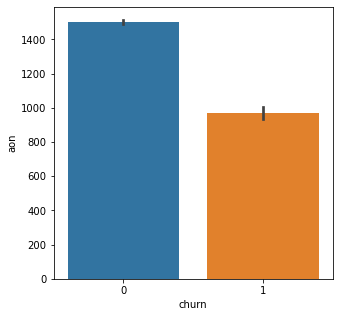

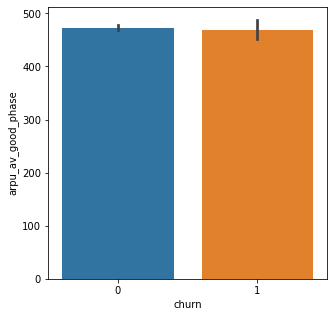

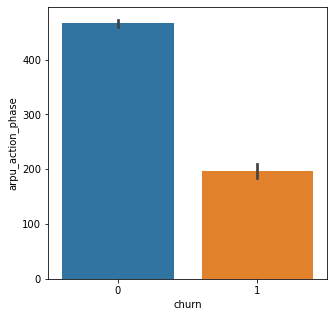

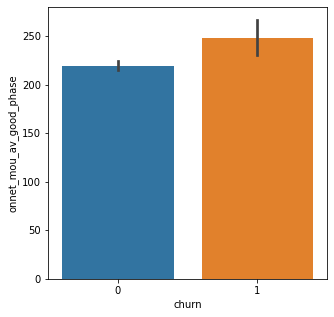

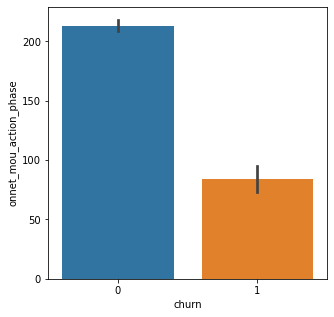

...

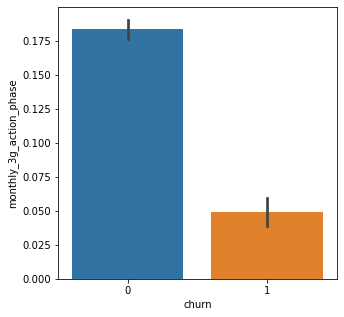

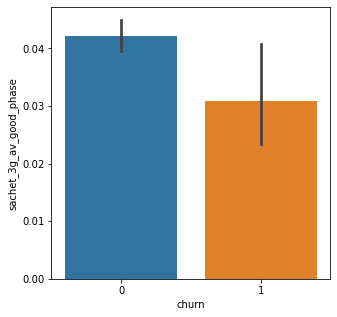

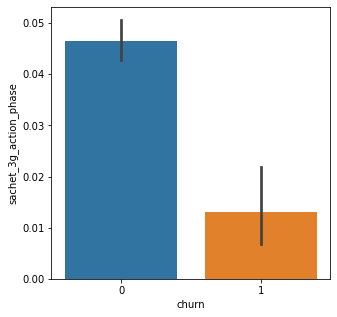

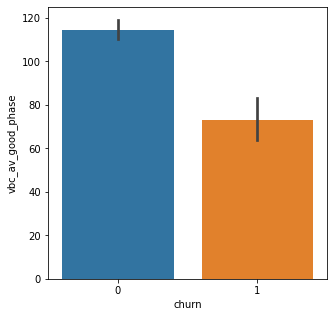

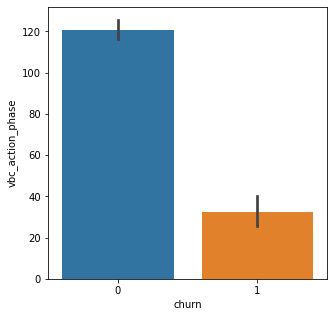

In [110]:
for col in num_cols:
    plt.figure(figsize=(5, 5))
    sns.barplot(x='churn', y=col, data=hvc)
    plt.show()

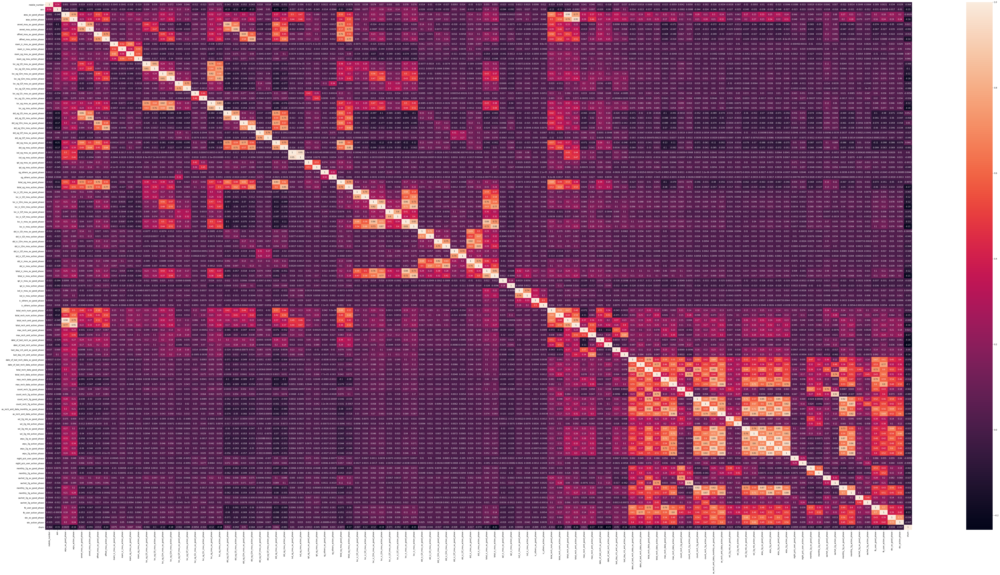

In [111]:
## checking correlation in the data 
%matplotlib inline
plt.figure(figsize = (100,50))
sns.heatmap(hvc.corr(),annot = True)

# Models Building

### Data Preparation for Logistic Models

#### Splitting Data into Training and Test Sets

In [112]:
# Putting feature variable to X
X = hvc.drop(['mobile_number','churn'],axis=1)

# Putting response variable to y
y = hvc['churn']

X.head()

,aon,arpu_av_good_phase,arpu_action_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,og_others_av_good_phase,og_others_action_phase,total_og_mou_good_phase,total_og_mou_action_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,ic_others_av_good_phase,ic_others_action_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,total_rech_data_good_phase,total_rech_data_action_phase,max_rech_data_good_phase,max_rech_data_action_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,arpu_3g_av_good_phase,arpu_3g_action_phase,arpu_2g_av_good_phase,arpu_2g_action_phase,night_pck_user_good_phase,night_pck_user_action_phase,monthly_2g_av_good_phase,monthly_2g_action_phase,sachet_2g_av_good_phase,sachet_2g_action_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,fb_user_good_phase,fb_user_action_phase,vbc_av_good_phase,vbc_action_phase
0,968,206.1005,213.803,0.000,0.00,0.000,0.00,0.000,0.00,0.000,0.00,0.000,0.00,0.000,0.00,0.000,0.00,0.00,0.00,0.000,0.00,0.000,0.00,0.000,0.00,0.00,0.00,0.000,0.00,0.00,0.00,0.00,0.00,0.000,0.0,0.00,0.00,0.00,0.16,0.000,4.13,0.000,1.15,0.000,5.44,0.000,0.00,0.000,0.00,0.000,0.00,0.000,0.00,0.00,5.44,0.000,0.0,0.000,0.00,0.000,0.00,7,2,614,252,252,252,18.5,8.0,252.0,252,18.5,8.0,2.0,1.0,252.0,252.0,0.0,0.0,2.0,1.0,252.0,252.0,15.725,5.75,117.165,109.61,212.17,212.17,212.17,212.17,0,0.0,0.0,0,0.0,0,1.0,1,0.0,0,1,1.0,50.600,30.40
2,1103,178.3740,210.226,33.390,37.26,181.960,208.36,0.000,0.00,0.000,0.00,17.965,13.58,23.100,38.46,22.950,15.61,67.77,45.76,64.035,67.66,15.415,22.58,54.610,75.53,8.12,22.83,78.160,120.94,0.00,0.00,141.70,96.84,0.225,0.0,568.27,285.46,93.40,67.46,14.910,38.89,110.885,49.63,219.210,155.99,71.850,28.69,111.095,167.09,40.035,43.23,222.995,239.03,889.57,395.03,0.105,0.0,0.425,0.00,2.035,0.00,9,2,483,116,200,86,20.5,14.0,100.0,86,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.00,0.000,0.00,0.00,0.00,0.00,0.00,0,0.0,0.0,0,0.0,0,0.0,0,0.0,0,0,0.0,2.085,0.00
7,802,1209.5150,3171.480,56.260,52.29,510.295,325.91,24.860,31.64,18.165,38.06,41.385,40.28,378.005,162.28,58.635,53.23,0.00,0.00,478.035,255.79,13.795,12.01,40.825,49.14,13.37,16.68,68.000,77.

In [113]:
y.head()

0     1
2     0
7     1
9     0
13    0
Name: churn, dtype: int64

In [114]:
from sklearn.model_selection import train_test_split
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)

In [115]:
## scaling the  non-dummy variables with min-max scaling
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

X_train[num_cols]=scaler.fit_transform(X_train[num_cols])
X_train.head()

,aon,arpu_av_good_phase,arpu_action_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,og_others_av_good_phase,og_others_action_phase,total_og_mou_good_phase,total_og_mou_action_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,ic_others_av_good_phase,ic_others_action_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,total_rech_data_good_phase,total_rech_data_action_phase,max_rech_data_good_phase,max_rech_data_action_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,arpu_3g_av_good_phase,arpu_3g_action_phase,arpu_2g_av_good_phase,arpu_2g_action_phase,night_pck_user_good_phase,night_pck_user_action_phase,monthly_2g_av_good_phase,monthly_2g_action_phase,sachet_2g_av_good_phase,sachet_2g_action_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,fb_user_good_phase,fb_user_action_phase,vbc_av_good_phase,vbc_action_phase
33510,0.555663,0.125386,0.078909,0.009580,0.005370,0.017258,0.019842,0.000000,0.000000,0.000000,0.000000,0.011821,0.005370,0.029711,0.070578,0.014340,0.063568,0.0,0.000000,0.027488,0.029716,0.000000,0.000000,0.001206,0.000416,0.000000,0.000000,0.000936,0.000415,0.002247,0.0,0.002097,0.002309,0.0,0.0,0.025652,0.023904,0.006050,0.003291,0.031290,0.016226,0.003596,0.000341,0.018383,0.012246,0.000409,0.000000,0.000250,0.000035,0.003713,0.000000,0.001842,0.000034,0.027718,0.042155,0.0,0.0,0.01157,0.045452,0.0,0.0,0.064,0.058824,0.039278,0.027171,0.018954,0.029220,1.000000,0.677419,0.039535,0.029220,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001896,0.005363,0.001740,0.015776,0,0.0,0.000000,0.00,0.0,0.0,0.000000,0.0,0.0,0.0,0,0.0,0.000013,0.000000
25392,0.073654,0.121820,0.071465,0.013716,0.016613,0.023992,0.027351,0.001751,0.000000,0.012280,0.000000,0.001270,0.000799,0.008412,0.004530,0.000454,0.000000,0.0,0.000000,0.005178,0.002150,0.012607,0.025529,0.019315,0.026377,0.000000,0.000000,0.027566,0.038483,0.000000,0.0,0.003895,0.000000,0.0,0.0,0.031998,0.040001,0.001531,0.001192,0.020873,0.007836,0.000614,0.001373,0.009521,0.006012,0.028374,0.011711,0.005031,0.000719,0.000000,0.000000

In [116]:
## describing the train data after it is scaled
## to check for appropriate scaling
X_train.describe()

,aon,arpu_av_good_phase,arpu_action_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,og_others_av_good_phase,og_others_action_phase,total_og_mou_good_phase,total_og_mou_action_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,ic_others_av_good_phase,ic_others_action_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,total_rech_data_good_phase,total_rech_data_action_phase,max_rech_data_good_phase,max_rech_data_action_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,arpu_3g_av_good_phase,arpu_3g_action_phase,arpu_2g_av_good_phase,arpu_2g_action_phase,night_pck_user_good_phase,night_pck_user_action_phase,monthly_2g_av_good_phase,monthly_2g_action_phase,sachet_2g_av_good_phase,sachet_2g_action_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,fb_user_good_phase,fb_user_action_phase,vbc_av_good_phase,vbc_action_phase
count,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,

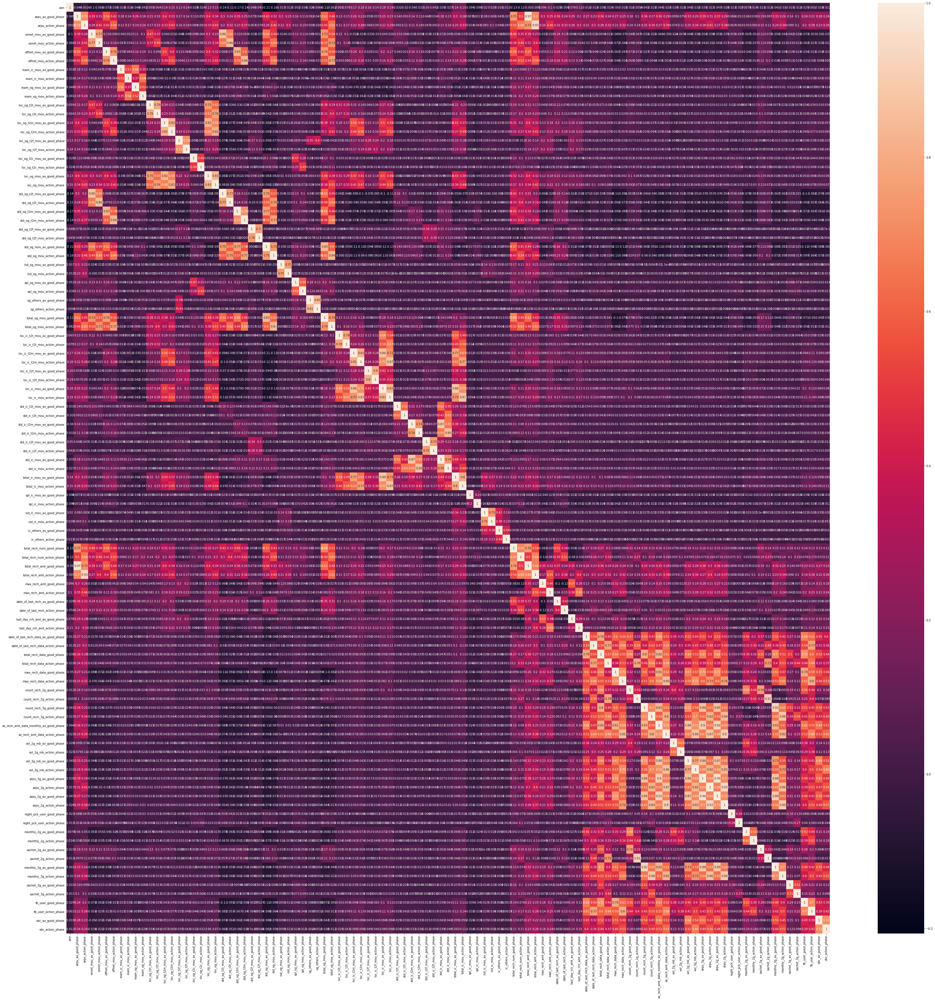

In [117]:
## In order to understand the correlation numerically for train set
## we need to prroduce the heat map to provide the directions going further
plt.figure(figsize = (60, 60))
sns.heatmap(X_train.corr(), annot = True)
plt.show()

## Logistic Training Models

### First training model using Basic Logistic Regression (with all variables)

In [118]:
import statsmodels.api as sm

logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                20962
Model:                            GLM   Df Residuals:                    20862
Model Family:                Binomial   Df Model:                           99
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3729.5
Date:                Mon, 30 Nov 2020   Deviance:                       7459.1
Time:                        11:23:36   Pearson chi2:                 3.91e+06
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
const                                      0.4766      0.341      1.399      0.162      -0.191       1.144
aon                                       -0.8621      0.160     -5.404      0.000      -1.175      -0.549
arpu_av_good_phase                         4.3429      2.913      1.491      0.136      -1.367      10.053
arpu_action_phase                          2.6966      2.640      1.021      0.307      -2.478       7.872
onnet_mou_av_good_phase                   12.2124     43.874      0.278      0.781     -73.778      98.203
onnet_mou_action_phase                     1.4927     60.316      0.025      0.980    -116.725     119.711
offnet_mou_av_good_phase                  13.0747     40.692      0.321      0.748     -66.681      92.830
offnet_mou_action_phase                    1.1813     77.722      0.015      0.988    -151.150     153.513
roam_ic_mou_av_good_phase                  2.9970      0.860      3.483      0.000       1.310       4.684
roam_ic_mou_action_phase                  -2.5623      0.940     -2.727      0.006      -4.404      -0.721
roam_og_mou_av_good_phase                 -1.9767     14.364     -0.138      0.891     -30.129      26.176
roam_og_mou_action_phase                  -1.0941     19.554     -0.056      0.955     -39.420      37.232
loc_og_t2t_mou_av_good_phase            8.766e+04   4.58e+04      1.914      0.056   -2110.687    1.77e+05
loc_og_t2t_mou_action_phase             5.398e+05   7.22e+04      7.475      0.000    3.98e+05    6.81e+05
loc_og_t2m_mou_av_good_phase            4.548e+04   2.38e+04      1.914      0.056   -1096.674    9.21e+04
loc_og_t2m_mou_action_phase             1.678e+05   2.24e+04      7.475      0.000    1.24e+05    2.12e+05
loc_og_t2f_mou_av_good_phase            1.964e+04   1.03e+04      1.913      0.056    -477.023    3.98e+04
loc_og_t2f_mou_action_phase             2.718e+04   3635.695      7.475      0.000    2.01e+04    3.43e+04
loc_og_t2c_mou_av_good_phase              -2.6658      1.702     -1.566      0.117      -6.002       0.671
loc_og_t2c_mou_action_phase                4.8411      1.930      2.508      0.012       1.058       8.624
loc_og_mou_av_good_phase                -1.13e+05   6.75e+04     -1.673      0.094   -2.45e+05    1.93e+04
loc_og_mou_action_phase                -1.568e+05   1.01e+05     -1.560      0.119   -3.54e+05    4.02e+04
std_og_t2t_mou_av_good_phase           -4.886e+04   6.94e+04     -0.704      0.482   -1.85e+05    8.72e+04
std_og_t2t_mou_action_phase             3.814e+04   5.94e+04      0.642      0.521   -7.83e+04    1.55e+05
std_og_t2m_mou_av_good_phase           -3.799e+04    5.4e+04     -0.704      0.482   -1.44e+05    6.78e+04
std_og_t2m_mou_action_phase             7.989e+04   1.24e+05      0.642      0.521   -1

This model contains lots of insignificant values and tuning this model will eventually involve dropping multiple vaiables one by one. Additionally, this is also not considering class-imbalance. Therefore, we limit here with this model and then proceed Logistic regression with GLM using RFE further. 

## Logistic Regression Training Model With Recursive Feature Elimination

In [119]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
## taking into account class imbalance
logreg = LogisticRegression(class_weight='balanced')

## running RFE with 25 variables as output
from sklearn.feature_selection import RFE
rfe = RFE(logreg, 25)             
rfe = rfe.fit(X_train, y_train)

In [120]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('aon', False, 14),
 ('arpu_av_good_phase', True, 1),
 ('arpu_action_phase', True, 1),
 ('onnet_mou_av_good_phase', False, 37),
 ('onnet_mou_action_phase', False, 6),
 ('offnet_mou_av_good_phase', False, 32),
 ('offnet_mou_action_phase', False, 2),
 ('roam_ic_mou_av_good_phase', True, 1),
 ('roam_ic_mou_action_phase', False, 41),
 ('roam_og_mou_av_good_phase', True, 1),
 ('roam_og_mou_action_phase', False, 7),
 ('loc_og_t2t_mou_av_good_phase', False, 38),
 ('loc_og_t2t_mou_action_phase', False, 26),
 ('loc_og_t2m_mou_av_good_phase', False, 71),
 ('loc_og_t2m_mou_action_phase', True, 1),
 ('loc_og_t2f_mou_av_good_phase', False, 63),
 ('loc_og_t2f_mou_action_phase', True, 1),
 ('loc_og_t2c_mou_av_good_phase', False, 44),
 ('loc_og_t2c_mou_action_phase', False, 24),
 ('loc_og_mou_av_good_phase', False, 43),
 ('loc_og_mou_action_phase', True, 1),
 ('std_og_t2t_mou_av_good_phase', False, 18),
 ('std_og_t2t_mou_action_phase', False, 17),
 ('std_og_t2m_mou_av_good_phase', False, 60),
 ('std_

In [121]:
## list of all the support variables
col = X_train.columns[rfe.support_]
col

Index(['arpu_av_good_phase', 'arpu_action_phase', 'roam_ic_mou_av_good_phase',
       'roam_og_mou_av_good_phase', 'loc_og_t2m_mou_action_phase',
       'loc_og_t2f_mou_action_phase', 'loc_og_mou_action_phase',
       'std_og_t2f_mou_action_phase', 'std_og_mou_av_good_phase',
       'std_og_mou_action_phase', 'total_og_mou_action_phase',
       'loc_ic_t2t_mou_action_phase', 'loc_ic_t2m_mou_action_phase',
       'loc_ic_mou_action_phase', 'std_ic_mou_action_phase',
       'total_ic_mou_av_good_phase', 'total_ic_mou_action_phase',
       'spl_ic_mou_action_phase', 'max_rech_amt_good_phase',
       'max_rech_amt_action_phase', 'last_day_rch_amt_action_phase',
       'total_rech_data_action_phase', 'max_rech_data_good_phase',
       'max_rech_data_action_phase', 'monthly_2g_av_good_phase'],
      dtype='object')

In [122]:
## creating model and checking the summary for significance of all variables
X_train_sm = sm.add_constant(X_train[col])
logm25 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm25.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                20962
Model:                            GLM   Df Residuals:                    20936
Model Family:                Binomial   Df Model:                           25
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4252.3
Date:                Mon, 30 Nov 2020   Deviance:                       8504.6
Time:                        11:24:21   Pearson chi2:                 6.25e+12
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                            -1.3568      0.123    -11.049      0.000      -1.598      -1.116
arpu_av_good_phase                7.3023      1.182      6.175      0.000       4.985       9.620
arpu_action_phase                -4.8414      1.545     -3.134      0.002      -7.869      -1.814
roam_ic_mou_av_good_phase         1.8226      0.694      2.626      0.009       0.462       3.183
roam_og_mou_av_good_phase         3.5271      0.802      4.395      0.000       1.954       5.100
loc_og_t2m_mou_action_phase      -4.9695      2.662     -1.867      0.062     -10.186       0.247
loc_og_t2f_mou_action_phase      -4.5203      2.387     -1.894      0.058      -9.199       0.159
loc_og_mou_action_phase         -17.2581     14.979     -1.152      0.249     -46.616      12.100
std_og_t2f_mou_action_phase      -9.0956      3.892     -2.337      0.019     -16.723      -1.468
std_og_mou_av_good_phase          2.4526      0.635      3.865      0.000       1.209       3.696
std_og_mou_action_phase         -19.0167     17.874     -1.064      0.287     -54.049      16.016
total_og_mou_action_phase         5.7064     17.995      0.317      0.751     -29.563      40.975
loc_ic_t2t_mou_action_phase       2.9510     17.688      0.167      0.867     -31.716      37.618
loc_ic_t2m_mou_action_phase      -8.4712     10.099     -0.839      0.402     -28.265      11.322
loc_ic_mou_action_phase         -47.3005     16.752     -2.824      0.005     -80.135     -14.466
std_ic_mou_action_phase         -23.7575      5.490     -4.328      0.000     -34.517     -12.998
total_ic_mou_av_good_phase       10.6228      1.307      8.130      0.000       8.062      13.184
total_ic_mou_action_phase        -6.7898      2.835     -2.395      0.017     -12.347      -1.232
spl_ic_mou_action_phase         -21.1993      3.611     -5.870      0.000     -28.278     -14.121
max_rech_amt_good_phase           2.3640      0.611      3.867      0.000       1.166       3.562
max_rech_amt_action_phase        -3.6930      1.419     -2.603      0.009      -6.473      -0.913
last_day_rch_amt_action_phase   -21.3359      1.993    -10.707      0.000     -25.242     -17.430
total_rech_data_action_phase     -5.3810      1.188     -4.530      0.000      -7.709      -3.053
max_rech_data_good_phase          2.0578      0.490      4.200      0.000       1.097       3.018
max_rech_data_action_phase       -4.2231      0.943     -4.477      0.000      -6.072      -2.374
monthly_2g_av_good_phase         -2.9605      0.622     -4.758      0.000      -4.180      -1.741
=================================================================================================
"""

In [123]:
# Dropping total_og_mou_action_phase column for high p value and creating the model again with remaining varibles of RFE

col = col.drop('total_og_mou_action_phase',1)

X_train_sm = sm.add_constant(X_train[col]) 
logm24 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm24.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                20962
Model:                            GLM   Df Residuals:                    20937
Model Family:                Binomial   Df Model:                           24
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4252.3
Date:                Mon, 30 Nov 2020   Deviance:                       8504.7
Time:                        11:24:21   Pearson chi2:                 5.92e+12
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                            -1.3663      0.119    -11.480      0.000      -1.600      -1.133
arpu_av_good_phase                7.3468      1.173      6.264      0.000       5.048       9.646
arpu_action_phase                -4.7168      1.495     -3.156      0.002      -7.646      -1.787
roam_ic_mou_av_good_phase         1.8181      0.694      2.620      0.009       0.458       3.178
roam_og_mou_av_good_phase         3.4904      0.794      4.396      0.000       1.934       5.047
loc_og_t2m_mou_action_phase      -5.0012      2.660     -1.880      0.060     -10.215       0.213
loc_og_t2f_mou_action_phase      -4.5139      2.386     -1.892      0.059      -9.190       0.163
loc_og_mou_action_phase         -12.8026      5.209     -2.458      0.014     -23.011      -2.594
std_og_t2f_mou_action_phase      -9.0889      3.891     -2.336      0.019     -16.715      -1.463
std_og_mou_av_good_phase          2.4372      0.633      3.853      0.000       1.197       3.677
std_og_mou_action_phase         -13.3778      1.879     -7.120      0.000     -17.060      -9.695
loc_ic_t2t_mou_action_phase       3.0025     17.688      0.170      0.865     -31.664      37.669
loc_ic_t2m_mou_action_phase      -8.4440     10.100     -0.836      0.403     -28.239      11.351
loc_ic_mou_action_phase         -47.3712     16.751     -2.828      0.005     -80.203     -14.540
std_ic_mou_action_phase         -23.7887      5.483     -4.338      0.000     -34.536     -13.041
total_ic_mou_av_good_phase       10.6180      1.299      8.174      0.000       8.072      13.164
total_ic_mou_action_phase        -6.7561      2.821     -2.395      0.017     -12.285      -1.228
spl_ic_mou_action_phase         -21.1884      3.611     -5.867      0.000     -28.267     -14.110
max_rech_amt_good_phase           2.3509      0.610      3.854      0.000       1.155       3.547
max_rech_amt_action_phase        -3.7206      1.418     -2.624      0.009      -6.500      -0.942
last_day_rch_amt_action_phase   -21.3382      1.993    -10.705      0.000     -25.245     -17.432
total_rech_data_action_phase     -5.3949      1.188     -4.543      0.000      -7.723      -3.067
max_rech_data_good_phase          2.0530      0.490      4.192      0.000       1.093       3.013
max_rech_data_action_phase       -4.2330      0.943     -4.488      0.000      -6.082      -2.384
monthly_2g_av_good_phase         -2.9605      0.622     -4.759      0.000      -4.180      -1.741
=================================================================================================
"""

In [124]:
# Dropping loc_ic_t2t_mou_action_phase column for high p value and creating the model again with remaining varibles of RFE

col = col.drop('loc_ic_t2t_mou_action_phase',1)

X_train_sm = sm.add_constant(X_train[col]) 
logm24 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm24.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                20962
Model:                            GLM   Df Residuals:                    20938
Model Family:                Binomial   Df Model:                           23
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4252.4
Date:                Mon, 30 Nov 2020   Deviance:                       8504.7
Time:                        11:24:21   Pearson chi2:                 6.00e+12
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                            -1.3670      0.119    -11.489      0.000      -1.600      -1.134
arpu_av_good_phase                7.3527      1.173      6.271      0.000       5.055       9.651
arpu_action_phase                -4.7162      1.495     -3.155      0.002      -7.646      -1.786
roam_ic_mou_av_good_phase         1.8176      0.694      2.619      0.009       0.457       3.178
roam_og_mou_av_good_phase         3.4921      0.794      4.396      0.000       1.935       5.049
loc_og_t2m_mou_action_phase      -5.0239      2.651     -1.895      0.058     -10.220       0.172
loc_og_t2f_mou_action_phase      -4.5928      2.344     -1.959      0.050      -9.187       0.002
loc_og_mou_action_phase         -12.6998      5.151     -2.466      0.014     -22.795      -2.604
std_og_t2f_mou_action_phase      -9.0961      3.892     -2.337      0.019     -16.725      -1.468
std_og_mou_av_good_phase          2.4350      0.632      3.850      0.000       1.195       3.675
std_og_mou_action_phase         -13.3661      1.877     -7.119      0.000     -17.046      -9.686
loc_ic_t2m_mou_action_phase      -9.8968      5.311     -1.863      0.062     -20.306       0.512
loc_ic_mou_action_phase         -44.8023      7.068     -6.338      0.000     -58.656     -30.948
std_ic_mou_action_phase         -23.8003      5.483     -4.341      0.000     -34.546     -13.054
total_ic_mou_av_good_phase       10.6222      1.299      8.179      0.000       8.077      13.168
total_ic_mou_action_phase        -6.7596      2.821     -2.396      0.017     -12.289      -1.230
spl_ic_mou_action_phase         -21.1850      3.611     -5.866      0.000     -28.263     -14.107
max_rech_amt_good_phase           2.3481      0.610      3.850      0.000       1.153       3.543
max_rech_amt_action_phase        -3.7194      1.418     -2.623      0.009      -6.498      -0.940
last_day_rch_amt_action_phase   -21.3394      1.993    -10.706      0.000     -25.246     -17.433
total_rech_data_action_phase     -5.3941      1.188     -4.542      0.000      -7.722      -3.066
max_rech_data_good_phase          2.0529      0.490      4.192      0.000       1.093       3.013
max_rech_data_action_phase       -4.2347      0.943     -4.489      0.000      -6.083      -2.386
monthly_2g_av_good_phase         -2.9619      0.622     -4.761      0.000      -4.181      -1.743
=================================================================================================
"""

In [125]:
# Dropping loc_ic_t2m_mou_action_phase column for high p value and creating the model again with remaining varibles of RFE

col = col.drop('loc_ic_t2m_mou_action_phase',1)

X_train_sm = sm.add_constant(X_train[col]) 
logm24 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm24.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                20962
Model:                            GLM   Df Residuals:                    20939
Model Family:                Binomial   Df Model:                           22
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4254.1
Date:                Mon, 30 Nov 2020   Deviance:                       8508.1
Time:                        11:24:22   Pearson chi2:                 6.39e+12
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                            -1.3697      0.119    -11.520      0.000      -1.603      -1.137
arpu_av_good_phase                7.3273      1.170      6.261      0.000       5.034       9.621
arpu_action_phase                -4.5980      1.491     -3.083      0.002      -7.521      -1.675
roam_ic_mou_av_good_phase         1.8264      0.696      2.625      0.009       0.463       3.190
roam_og_mou_av_good_phase         3.4613      0.794      4.359      0.000       1.905       5.018
loc_og_t2m_mou_action_phase      -6.5343      2.462     -2.655      0.008     -11.359      -1.710
loc_og_t2f_mou_action_phase      -4.4143      2.333     -1.892      0.058      -8.986       0.158
loc_og_mou_action_phase         -10.7963      4.672     -2.311      0.021     -19.952      -1.640
std_og_t2f_mou_action_phase      -9.0997      3.894     -2.337      0.019     -16.732      -1.467
std_og_mou_av_good_phase          2.4376      0.632      3.859      0.000       1.199       3.676
std_og_mou_action_phase         -13.4137      1.877     -7.148      0.000     -17.092      -9.736
loc_ic_mou_action_phase         -55.6408      4.257    -13.072      0.000     -63.984     -47.298
std_ic_mou_action_phase         -23.6562      5.479     -4.318      0.000     -34.394     -12.918
total_ic_mou_av_good_phase       10.6291      1.285      8.269      0.000       8.110      13.148
total_ic_mou_action_phase        -6.8140      2.817     -2.418      0.016     -12.336      -1.292
spl_ic_mou_action_phase         -21.2816      3.615     -5.888      0.000     -28.366     -14.197
max_rech_amt_good_phase           2.3424      0.610      3.840      0.000       1.147       3.538
max_rech_amt_action_phase        -3.7672      1.419     -2.655      0.008      -6.548      -0.986
last_day_rch_amt_action_phase   -21.2857      1.993    -10.679      0.000     -25.192     -17.379
total_rech_data_action_phase     -5.3916      1.188     -4.540      0.000      -7.719      -3.064
max_rech_data_good_phase          2.0429      0.489      4.176      0.000       1.084       3.002
max_rech_data_action_phase       -4.2425      0.943     -4.498      0.000      -6.091      -2.394
monthly_2g_av_good_phase         -2.9624      0.622     -4.764      0.000      -4.181      -1.744
=================================================================================================
"""

In [126]:
# Dropping loc_og_t2f_mou_action_phase column for high p value and creating the model again with remaining varibles of RFE

col = col.drop('loc_og_t2f_mou_action_phase',1)

X_train_sm = sm.add_constant(X_train[col]) 
logm24 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm24.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                20962
Model:                            GLM   Df Residuals:                    20940
Model Family:                Binomial   Df Model:                           21
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4256.2
Date:                Mon, 30 Nov 2020   Deviance:                       8512.3
Time:                        11:24:22   Pearson chi2:                 6.82e+12
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                            -1.3719      0.119    -11.531      0.000      -1.605      -1.139
arpu_av_good_phase                7.3870      1.171      6.311      0.000       5.093       9.681
arpu_action_phase                -4.6967      1.495     -3.142      0.002      -7.627      -1.766
roam_ic_mou_av_good_phase         1.8341      0.695      2.641      0.008       0.473       3.195
roam_og_mou_av_good_phase         3.5255      0.794      4.441      0.000       1.970       5.081
loc_og_t2m_mou_action_phase      -6.5466      2.536     -2.581      0.010     -11.517      -1.576
loc_og_mou_action_phase         -11.8067      4.930     -2.395      0.017     -21.469      -2.145
std_og_t2f_mou_action_phase      -9.8087      3.957     -2.479      0.013     -17.564      -2.054
std_og_mou_av_good_phase          2.4508      0.632      3.879      0.000       1.212       3.689
std_og_mou_action_phase         -13.1967      1.873     -7.047      0.000     -16.867      -9.527
loc_ic_mou_action_phase         -56.2156      4.294    -13.092      0.000     -64.631     -47.800
std_ic_mou_action_phase         -23.6623      5.486     -4.313      0.000     -34.415     -12.910
total_ic_mou_av_good_phase       10.6417      1.293      8.229      0.000       8.107      13.176
total_ic_mou_action_phase        -6.9806      2.859     -2.441      0.015     -12.585      -1.376
spl_ic_mou_action_phase         -21.1801      3.613     -5.862      0.000     -28.261     -14.099
max_rech_amt_good_phase           2.1986      0.603      3.646      0.000       1.017       3.381
max_rech_amt_action_phase        -3.9451      1.415     -2.788      0.005      -6.719      -1.171
last_day_rch_amt_action_phase   -21.3350      1.993    -10.707      0.000     -25.240     -17.430
total_rech_data_action_phase     -5.3527      1.186     -4.512      0.000      -7.678      -3.027
max_rech_data_good_phase          2.0835      0.489      4.263      0.000       1.126       3.041
max_rech_data_action_phase       -4.2135      0.943     -4.468      0.000      -6.062      -2.365
monthly_2g_av_good_phase         -2.9705      0.622     -4.775      0.000      -4.190      -1.751
=================================================================================================
"""

#### Check the VIF now

In [127]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [128]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
13,total_ic_mou_action_phase,19.19
0,const,15.58
10,loc_ic_mou_action_phase,13.18
11,std_ic_mou_action_phase,4.05
2,arpu_action_phase,3.97
1,arpu_av_good_phase,3.53
8,std_og_mou_av_good_phase,3.45
9,std_og_mou_action_phase,3.42
5,loc_og_t2m_mou_action_phase,3.14
6,loc_og_mou_action_phase,3.13


In [129]:
## dropping the variable "total_ic_mou_action_phase" for high VIF and creating the model again with remaining varibles of RFE

col = col.drop('total_ic_mou_action_phase',1)

X_train_sm = sm.add_constant(X_train[col]) 
logm24 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm24.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                20962
Model:                            GLM   Df Residuals:                    20941
Model Family:                Binomial   Df Model:                           20
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4260.1
Date:                Mon, 30 Nov 2020   Deviance:                       8520.3
Time:                        11:24:24   Pearson chi2:                 8.85e+12
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                            -1.3773      0.119    -11.533      0.000      -1.611      -1.143
arpu_av_good_phase                7.6553      1.170      6.544      0.000       5.363       9.948
arpu_action_phase                -4.9604      1.482     -3.346      0.001      -7.866      -2.055
roam_ic_mou_av_good_phase         1.8895      0.691      2.734      0.006       0.535       3.244
roam_og_mou_av_good_phase         3.4765      0.791      4.393      0.000       1.926       5.028
loc_og_t2m_mou_action_phase      -6.5708      2.546     -2.581      0.010     -11.561      -1.581
loc_og_mou_action_phase         -11.7917      4.979     -2.368      0.018     -21.551      -2.033
std_og_t2f_mou_action_phase      -9.6528      3.946     -2.446      0.014     -17.387      -1.919
std_og_mou_av_good_phase          2.4908      0.633      3.934      0.000       1.250       3.732
std_og_mou_action_phase         -13.2320      1.871     -7.071      0.000     -16.900      -9.564
loc_ic_mou_action_phase         -61.9649      3.475    -17.834      0.000     -68.775     -55.155
std_ic_mou_action_phase         -31.2701      4.749     -6.584      0.000     -40.579     -21.961
total_ic_mou_av_good_phase        9.0327      1.113      8.113      0.000       6.851      11.215
spl_ic_mou_action_phase         -21.3047      3.616     -5.891      0.000     -28.392     -14.217
max_rech_amt_good_phase           2.1887      0.603      3.627      0.000       1.006       3.372
max_rech_amt_action_phase        -3.9829      1.418     -2.810      0.005      -6.761      -1.205
last_day_rch_amt_action_phase   -21.3508      1.992    -10.720      0.000     -25.254     -17.447
total_rech_data_action_phase     -5.2792      1.178     -4.483      0.000      -7.588      -2.971
max_rech_data_good_phase          2.0624      0.489      4.221      0.000       1.105       3.020
max_rech_data_action_phase       -4.2675      0.938     -4.550      0.000      -6.106      -2.429
monthly_2g_av_good_phase         -2.9090      0.618     -4.706      0.000      -4.121      -1.697
=================================================================================================
"""

In [130]:
## checking VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,15.58
2,arpu_action_phase,3.91
1,arpu_av_good_phase,3.51
8,std_og_mou_av_good_phase,3.44
9,std_og_mou_action_phase,3.41
5,loc_og_t2m_mou_action_phase,3.14
6,loc_og_mou_action_phase,3.13
19,max_rech_data_action_phase,2.77
10,loc_ic_mou_action_phase,2.77
12,total_ic_mou_av_good_phase,2.73


In [131]:
## Making predictions now
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

33510    5.548897e-02
25392    9.180457e-02
63251    1.478399e-02
97628    2.463081e-05
20699    2.779454e-02
4793     3.026989e-07
82660    5.571718e-04
74050    1.484082e-01
92154    2.228356e-05
47382    4.729023e-03
dtype: float64

In [132]:
## reshaping the values to get an array
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([5.54889704e-02, 9.18045663e-02, 1.47839883e-02, 2.46308123e-05,
       2.77945439e-02, 3.02698882e-07, 5.57171833e-04, 1.48408232e-01,
       2.22835578e-05, 4.72902283e-03])

In [133]:
## putting the model provided probability values and the actual values in a dataframe along with row numbers
y_train_pred_df = pd.DataFrame({'churn':y_train.values, 'churn_pred':y_train_pred})
y_train_pred_df['id'] = y_train.index
y_train_pred_df.head()

,churn,churn_pred,id
0,0,0.055489,33510
1,0,0.091805,25392
2,0,0.014784,63251
3,0,0.000025,97628
4,0,0.027795,20699


In [134]:
## making prediction with any arbitrary cut-off value
y_train_pred_df['prediction']= y_train_pred_df.churn_pred.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_df.head()

,churn,churn_pred,id,prediction
0,0,0.055489,33510,0
1,0,0.091805,25392,0
2,0,0.014784,63251,0
3,0,0.000025,97628,0
4,0,0.027795,20699,0


In [135]:
## checking accuracy
from sklearn import metrics
print(metrics.accuracy_score(y_train_pred_df.churn, y_train_pred_df.prediction))

0.9178036446903921


#### Plotting ROC Curve

In [136]:
## function to draw the ROC curve
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(10, 10))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic for model')
    plt.legend(loc="lower right")
    plt.show()

    return None

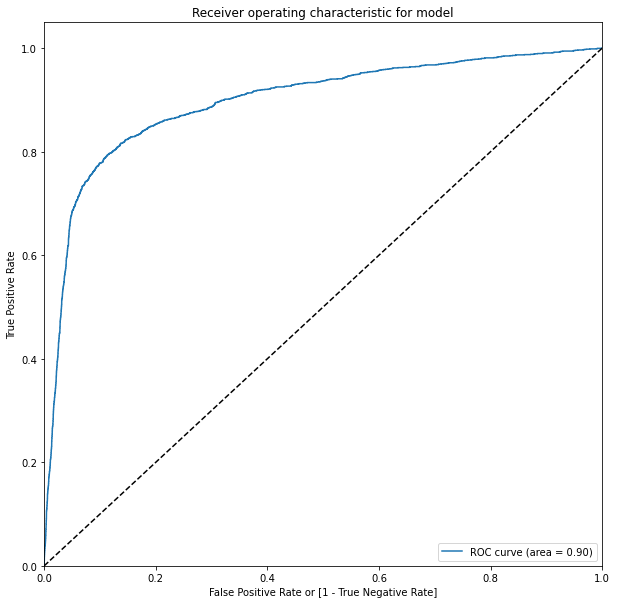

In [137]:
## using roc_cuve from the matrics

fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_df.churn, y_train_pred_df.prediction, drop_intermediate = False )

## draw ROC curve based on the probability values generated by the model

draw_roc(y_train_pred_df.churn, y_train_pred_df.churn_pred)

#### Finding Optimal Cutoff Point

In [138]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.churn_pred.map(lambda x: 1 if x > i else 0)
y_train_pred_df.head()

,churn,churn_pred,id,prediction,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.055489,33510,0,1,0,0,0,0,0,0,0,0,0
1,0,0.091805,25392,0,1,0,0,0,0,0,0,0,0,0
2,0,0.014784,63251,0,1,0,0,0,0,0,0,0,0,0
3,0,0.000025,97628,0,1,0,0,0,0,0,0,0,0,0
4,0,0.027795,20699,0,1,0,0,0,0,0,0,0,0,0


In [139]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci','ppv','npv'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_df.churn, y_train_pred_df[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    ppv = cm1[1,1] /(cm1[1,1]+cm1[0,1])
    npv = cm1[0,0]/(cm1[0,0]+cm1[1,0])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci,ppv, npv ]
print(cutoff_df)

     prob  accuracy     sensi     speci       ppv       npv
0.0   0.0  0.090926  1.000000  0.000000  0.090926       NaN
0.1   0.1  0.810944  0.849423  0.807095  0.305760  0.981681
0.2   0.2  0.895525  0.764428  0.908638  0.455597  0.974724
0.3   0.3  0.926772  0.675236  0.951931  0.584203  0.967003
0.4   0.4  0.924244  0.421301  0.974549  0.623447  0.943936
0.5   0.5  0.917804  0.224029  0.987196  0.636364  0.927111
0.6   0.6  0.915323  0.124344  0.994437  0.690962  0.919055
0.7   0.7  0.911936  0.060860  0.997061  0.674419  0.913901
0.8   0.8  0.910982  0.029906  0.999108  0.770270  0.911480
0.9   0.9  0.910028  0.012592  0.999790  0.857143  0.910098


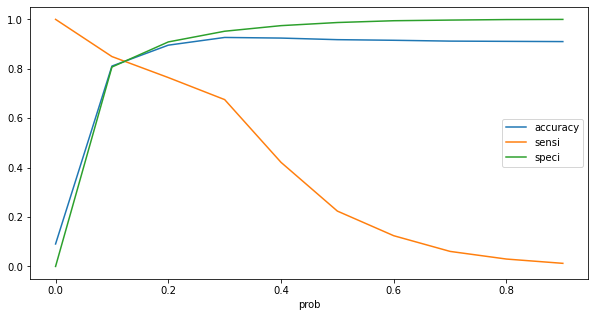

In [140]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'],figsize=(10, 5))
plt.show()

In [141]:
## making our final prediction on basis of optimal cut-off of 0.17
y_train_pred_df['final_predicted'] = y_train_pred_df.churn_pred.map( lambda x: 1 if x > 0.17 else 0)
y_train_pred_df.head()

,churn,churn_pred,id,prediction,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.055489,33510,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0.091805,25392,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0.014784,63251,0,1,0,0,0,0,0,0,0,0,0,0
3,0,0.000025,97628,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0.027795,20699,0,1,0,0,0,0,0,0,0,0,0,0


In [142]:
## creating confusion matrix
confusion_matrix = metrics.confusion_matrix(y_train_pred_df.churn, y_train_pred_df.final_predicted )
confusion_matrix

array([[16932,  2124],
       [  398,  1508]], dtype=int64)

In [143]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_train_pred_df.churn, y_train_pred_df.final_predicted)

0.879687052762141

In [144]:
from sklearn.metrics import precision_score, recall_score
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_train_pred_df.churn, y_train_pred_df.final_predicted))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_train_pred_df.churn, y_train_pred_df.final_predicted))

precision :  0.41519823788546256
recall :  0.7911857292759706


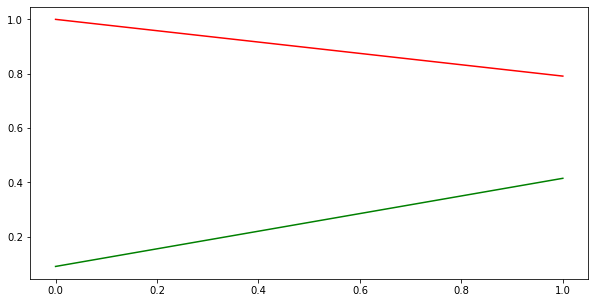

In [145]:
## using precision_recall_curve from matrics
from sklearn.metrics import precision_recall_curve
p, r, thresholds = precision_recall_curve(y_train_pred_df.churn, y_train_pred_df.final_predicted)

plt.figure(figsize=(10, 5))
plt.plot(thresholds, p[:-1], "g-", label ="precision")
plt.plot(thresholds, r[:-1], "r-", label ="recall")
plt.show()

#### Prediction on test data

In [146]:
## transforming test data
X_test[num_cols]=scaler.transform(X_test[num_cols])
X_test.head()

,aon,arpu_av_good_phase,arpu_action_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,og_others_av_good_phase,og_others_action_phase,total_og_mou_good_phase,total_og_mou_action_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,ic_others_av_good_phase,ic_others_action_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,total_rech_data_good_phase,total_rech_data_action_phase,max_rech_data_good_phase,max_rech_data_action_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,arpu_3g_av_good_phase,arpu_3g_action_phase,arpu_2g_av_good_phase,arpu_2g_action_phase,night_pck_user_good_phase,night_pck_user_action_phase,monthly_2g_av_good_phase,monthly_2g_action_phase,sachet_2g_av_good_phase,sachet_2g_action_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,fb_user_good_phase,fb_user_action_phase,vbc_av_good_phase,vbc_action_phase
60217,0.037431,0.142750,0.041121,0.081228,0.000024,0.040217,0.000035,0.000232,0.016052,0.005048,0.000218,0.000936,0.000000,0.013717,0.000000,0.000000,0.000000,0.007999,0.000000,0.007270,0.000000,0.079366,0.000000,0.040680,0.000000,0.000000,0.0,0.110760,0.000000,0.000000,0.000000,0.005211,0.000000,0.007997,0.0,0.116018,0.000000,0.000766,0.000000,0.017513,0.000000,0.000000,0.000000,0.007394,0.000000,0.003735,0.000000,0.005323,0.000000,0.000000,0.0,0.007409,0.000000,0.010559,0.000000,0.000000,0.0,0.000000,0.000000,0.000056,0.000000,0.120,0.044118,0.056093,0.000000,0.014405,0.000000,1.000000,0.903226,0.018272,0.000000,0.000000,0.000000,0.037037,0.000000,0.095820,0.000000,0.083333,0.000000,0.000000,0.0000,0.014487,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.001896,0.005363,0.001740,0.015776,0,0.0,0.111111,0.0,0.0,0.000000,0.000000,0.0000,0.0,0.0,0,0.0,0.000000,0.000000
26722,0.067134,0.114882,0.055677,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000

In [147]:
## adding constant to the test dataset
X_test_sm = sm.add_constant(X_test[col])

In [148]:
## making prediction probabilities
y_test_pred = res.predict(X_test_sm)
## checking values
y_test_pred[:10]

60217    0.451816
26722    0.243176
82411    0.021281
16868    0.017359
38631    0.005165
26358    0.045985
35078    0.009279
57150    0.288465
75575    0.015228
10484    0.542785
dtype: float64

In [149]:
# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

# Let's see the head
y_pred_1.head()

,0
60217,0.451816
26722,0.243176
82411,0.021281
16868,0.017359
38631,0.005165


In [150]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

y_test_df['id'] = y_test_df.index

In [151]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

# Appending y_test_df and y_pred_1
y_pred_df = pd.concat([y_test_df, y_pred_1],axis=1)
y_pred_df.head()

,churn,id,0
0,0,60217,0.451816
1,0,26722,0.243176
2,0,82411,0.021281
3,0,16868,0.017359
4,0,38631,0.005165


In [152]:
# Renaming the column 
y_pred_df= y_pred_df.rename(columns={ 0 : 'churn_pred'})

# Rearranging the columns
y_pred_df = y_pred_df.reindex(['id','churn','churn_pred'], axis=1)

# Let's see the head of y_pred_df
y_pred_df.head()

,id,churn,churn_pred
0,60217,0,0.451816
1,26722,0,0.243176
2,82411,0,0.021281
3,16868,0,0.017359
4,38631,0,0.005165


In [153]:
## evaluating result based on the cut-off value obtained above
y_pred_df['final_predicted'] = y_pred_df.churn_pred.map(lambda x: 1 if x > 0.17 else 0)
y_pred_df.head()

,id,churn,churn_pred,final_predicted
0,60217,0,0.451816,1
1,26722,0,0.243176,1
2,82411,0,0.021281,0
3,16868,0,0.017359,0
4,38631,0,0.005165,0


In [154]:
## creating confusion matrix for test data
confusion2 = metrics.confusion_matrix(y_pred_df.churn, y_pred_df.final_predicted )
confusion2

array([[7271,  957],
       [ 144,  612]], dtype=int64)

In [155]:
## checking for  accuracy, precision and recall
print("accuracy : ", metrics.accuracy_score(y_pred_df.churn, y_pred_df.final_predicted))
print("precision : ", metrics.precision_score(y_pred_df.churn, y_pred_df.final_predicted))
print("recall : ", metrics.recall_score(y_pred_df.churn, y_pred_df.final_predicted))

accuracy :  0.8774487978628673
precision :  0.390057361376673
recall :  0.8095238095238095


#### The logistic regression model with RFE after tuning provided the recall value of 80.95% on test data.

## Logistic Regression Model using Regularization (L1 / L2)

In [156]:
# Grid search cross validation
from sklearn.linear_model import LogisticRegression

# grid search CV
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV


# set up cross validation scheme
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# specify range of hyperparameters
params = {"C":np.logspace(-3,3,7), "penalty":["l1","l2"]}# l1 lasso l2 ridge

## using Logistic regression for class imbalance
model = LogisticRegression(class_weight='balanced')
model_cv = GridSearchCV(estimator = model, param_grid = params, 
                        scoring= 'recall', 
                        cv = folds, 
                        return_train_score=True, verbose = 1)            
model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 14 candidates, totalling 70 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  70 out of  70 | elapsed:   17.9s finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             estimator=LogisticRegression(class_weight='balanced'),
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l1', 'l2']},
             return_train_score=True, scoring='recall', verbose=1)

In [157]:
## reviewing the results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_penalty,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.012395,0.000490,0.000000,0.000000,0.001,l1,"{'C': 0.001, 'penalty': 'l1'}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.107536,0.005080,0.012589,0.003663,0.001,l2,"{'C': 0.001, 'penalty': 'l2'}",0.732283,0.753927,0.748031,0.737533,0.748031,0.743961,0.007876,7,0.744262,0.757218,0.746885,0.739016,0.758689,0.749214,0.007586
2,0.014992,0.001264,0.000000,0.000000,0.01,l1,"{'C': 0.01, 'penalty': 'l1'}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.208472,0.008818,0.013991,0.000894,0.01,l2,"{'C': 0.01, 'penalty': 'l2'}",0.742782,0.782723,0.782152,0.750656,0.769029,0.765468,0.016265,6,0.773770,0.776247,0.761967,0.761311,0.772459,0.769151,0.006256
4,0.019789,0.000748,0.000000,0.000000,0.1,l1,"{'C': 0.1, 'penalty': 'l1'}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,0.345189,0.026620,0.009591,0.001623,0.1,l2,"{'C': 0.1, 'penalty': 'l2'}",0.821522,0.814136,0.813648,0.800525,0.800525,0.810071,0.008279,5,0.807213,0.812336,0.811803,0.813770,0.811148,0.811254,0.002198
6,0.014792,0.000748,0.000000,0.000000,1,l1,"{'C': 1.0, 'penalty': 'l1'}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,11,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,0.652609,0.056261,0.010843,0.005736,1,l2,"{'C': 1.0, 'penalty': 'l2'}",0.850394,0.842932,0.832021,0.829396,0.829396,0.836828,0.008424,4,0.843279,0.849081,0.844590,0.846557,0.837377,0.844177,0.003923
8,0.018750,0.006251,0.000000,0.000000,10,l1,"{'C': 10.0, 'penalty': 'l1'}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,0.618734,0.027240,0.003124,0.006248,10,l2,"{'C': 10.0, 'penalty': 'l2'}",0.853018,0.850785,0.839895,0.834646,0.832021,0.842073,0.008446,1,0.853770,0.853018,0.850492,0.853770,0.847213,0.851653,0.002526


In [158]:
## segerigating results for L1 and L2 regression and plotting them differently
cv_results_penalty_l1 = cv_results.loc[cv_results['param_penalty']=='l1']
cv_results_penalty_l2 = cv_results.loc[cv_results['param_penalty']=='l2']

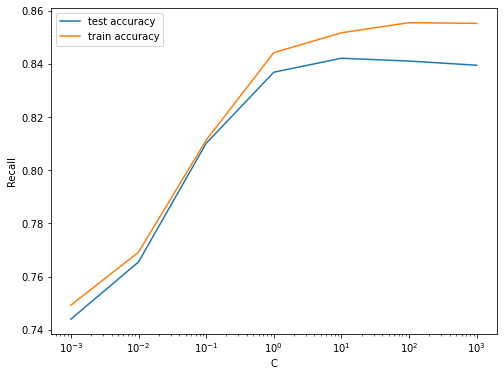

In [159]:
## plotting results for Logistic regression with L2 panelty
plt.figure(figsize=(8, 6))
plt.plot(cv_results_penalty_l2['param_C'], cv_results_penalty_l2['mean_test_score'])
plt.plot(cv_results_penalty_l2['param_C'], cv_results_penalty_l2['mean_train_score'])
plt.xlabel('C')
plt.ylabel('Recall')
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')
plt.xscale('log')

In [160]:
## checking best score
best_score = model_cv.best_score_
best_param = model_cv.best_params_

print(" The highest test recall is {0} at {1}".format(best_score, best_param))

 The highest test recall is 0.8420730785615149 at {'C': 10.0, 'penalty': 'l2'}


In [161]:
## preparing final model based on best score
model=LogisticRegression(C=10,penalty="l2")
model.fit(X_train,y_train)

y_pred = model.predict(X_test)

# metrics
# print other metrics

print(metrics.confusion_matrix(y_test, y_pred))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, y_pred))

# precision
print("precision", metrics.precision_score(y_test, y_pred))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, y_pred))

[[8121  107]
 [ 503  253]]
accuracy 0.9321015138023152
precision 0.7027777777777777
recall 0.33465608465608465


#### Result : The logistic regression model with L2 regularization after tuning provided the accuracy 93.2%, precision 70.2% on test data.

## Logistic model with PCA

In [162]:
# Let's see train data shape first
X_train.shape

(20962, 105)

In [163]:
#Improting the PCA module
from sklearn.decomposition import PCA
pca = PCA(svd_solver='randomized', random_state=42)

In [164]:
#Doing the PCA on the train data
pca.fit(X_train)

PCA(random_state=42, svd_solver='randomized')

In [165]:
# pca components first

pca.components_

array([[-7.36091892e-03,  1.99614940e-02,  2.21161750e-02, ...,
         5.87738804e-01,  2.97181337e-02,  3.02677530e-02],
       [ 8.02513707e-02, -4.74132579e-02, -6.54581393e-02, ...,
        -1.41583253e-01,  8.10765178e-03, -1.97343601e-03],
       [ 3.69294966e-01, -4.64354699e-02, -2.35695121e-02, ...,
         4.48758170e-01, -1.05209156e-02,  1.94681392e-03],
       ...,
       [ 0.00000000e+00,  2.61434207e-16,  2.81111744e-17, ...,
         2.57450870e-19,  1.40779395e-17, -1.38413317e-16],
       [ 0.00000000e+00,  6.75527515e-17, -3.49476228e-17, ...,
         3.67100310e-18,  9.29468931e-17,  3.73307522e-17],
       [-0.00000000e+00, -5.70546300e-17, -9.61920698e-17, ...,
        -1.53426881e-17, -3.37054836e-17,  4.32723960e-18]])

In [166]:
# Data frame with pc1 and pc2
colnames = list(X_train.columns)
pcs_df = pd.DataFrame({'PC1':pca.components_[0],'PC2':pca.components_[1], 'Feature':colnames})
pcs_df.head()

,PC1,PC2,Feature
0,-0.007361,0.080251,aon
1,0.019961,-0.047413,arpu_av_good_phase
2,0.022116,-0.065458,arpu_action_phase
3,-0.003373,-0.050719,onnet_mou_av_good_phase
4,-0.001184,-0.038643,onnet_mou_action_phase


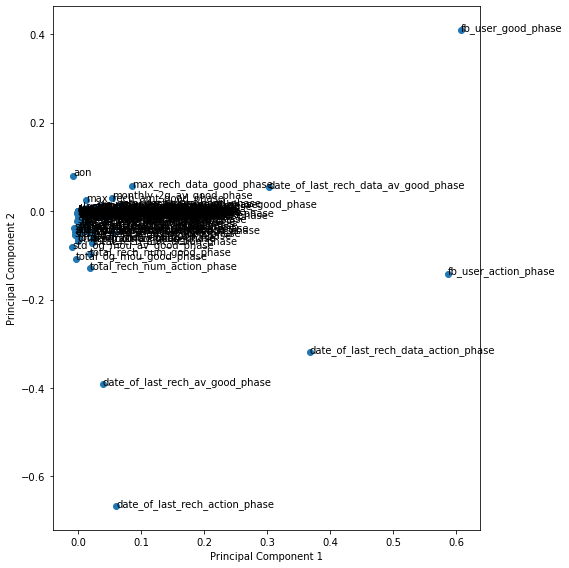

In [167]:
# Plot original features on the first 2 principal components as axes
%matplotlib inline
fig = plt.figure(figsize = (8,8))
plt.scatter(pcs_df.PC1, pcs_df.PC2)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
for i, txt in enumerate(pcs_df.Feature):
    plt.annotate(txt, (pcs_df.PC1[i],pcs_df.PC2[i]))
plt.tight_layout()
plt.show()

#### Looking at the screeplot to assess the number of needed principal components

In [168]:
pca.explained_variance_ratio_

array([4.97239503e-01, 1.06268644e-01, 7.90654951e-02, 6.67691102e-02,
       3.97146749e-02, 3.39437390e-02, 2.82053002e-02, 2.23148909e-02,
       1.67963385e-02, 1.57136049e-02, 7.46583928e-03, 6.86616705e-03,
       6.50669495e-03, 5.90710860e-03, 5.26650534e-03, 4.55455552e-03,
       4.34893310e-03, 3.83755623e-03, 3.11328183e-03, 2.91610705e-03,
       2.88266025e-03, 2.60168369e-03, 2.49549068e-03, 2.42442988e-03,
       2.17716710e-03, 1.95460952e-03, 1.77318044e-03, 1.70712184e-03,
       1.52877239e-03, 1.44694489e-03, 1.39803751e-03, 1.22353292e-03,
       1.15552475e-03, 1.13142300e-03, 9.98068931e-04, 9.40716127e-04,
       9.28438420e-04, 8.95971104e-04, 8.40118973e-04, 7.69892931e-04,
       7.49913433e-04, 6.99790774e-04, 6.82097994e-04, 6.56825199e-04,
       6.31163130e-04, 6.18099828e-04, 5.58858077e-04, 4.94256499e-04,
       4.87484271e-04, 4.71326941e-04, 4.49970731e-04, 3.83926285e-04,
       3.70669284e-04, 3.60303152e-04, 3.19281466e-04, 3.07493965e-04,
      

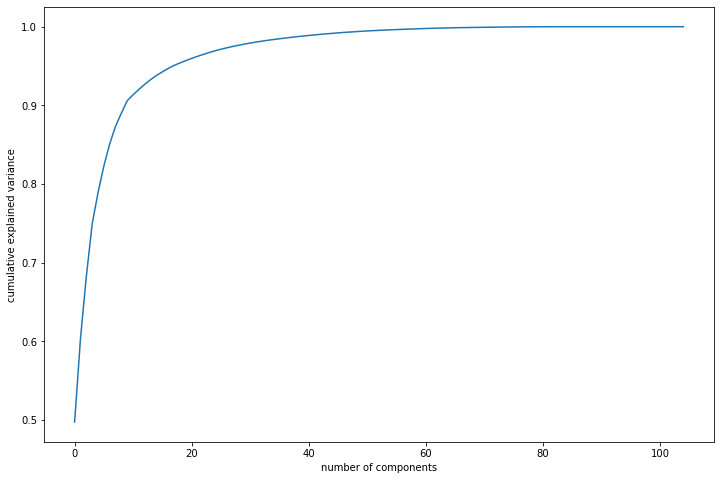

In [169]:
#Making the screeplot - plotting the cumulative variance against the number of components
%matplotlib inline
fig = plt.figure(figsize = (12,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

#### Looks like 25 components are enough to describe 95% of the variance in the dataset
- We'll choose 25 components for our modeling

In [170]:
#Using incremental PCA for efficiency - saves a lot of time on larger datasets
from sklearn.decomposition import IncrementalPCA
pca_final = IncrementalPCA(n_components=25)

In [171]:
# Basis transformation - getting the data onto our PCs
df_train_pca = pca_final.fit_transform(X_train)
df_train_pca.shape

(20962, 25)

In [172]:
#creating correlation matrix for the principal components
corrmat = np.corrcoef(df_train_pca.transpose())

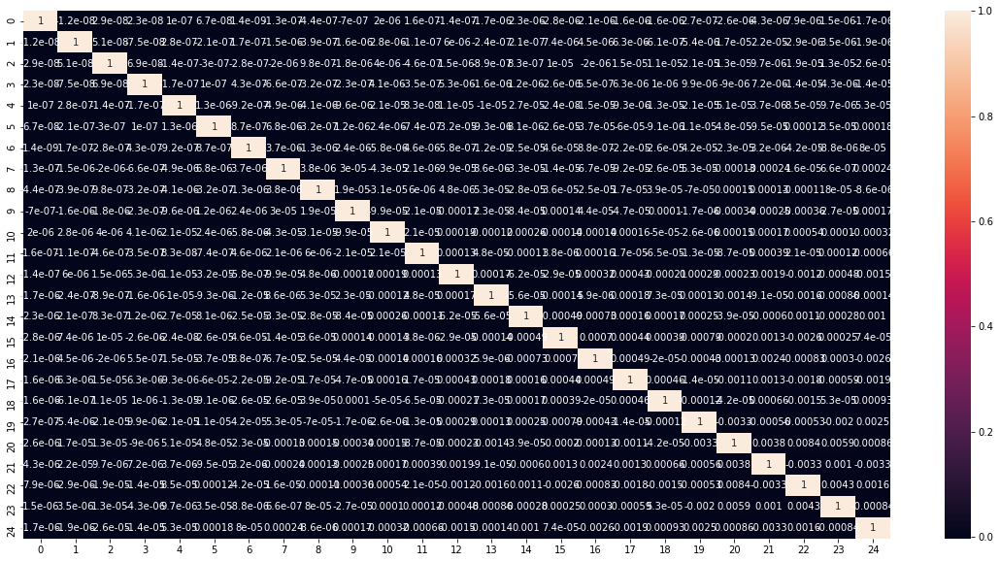

In [173]:
#### Creating correlation matrix for the principal components - we expect little to no correlation
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (20,10))
sns.heatmap(corrmat,annot = True)

In [174]:

corrmat_nodiag = corrmat - np.diagflat(corrmat.diagonal())
print("max corr:",corrmat_nodiag.max(), ", min corr: ", corrmat_nodiag.min(),)
# we see that correlations are indeed very close to 0

max corr: 0.008374741486718839 , min corr:  -0.0032726182158459923


we see that correlations are indeed very close to 0.

so It's clear that we have removed multicollinearity from our model. So the model will perform good.

In [175]:
#Applying selected components to the test data 
df_test_pca = pca_final.transform(X_test)
df_test_pca.shape

(8984, 25)

#### Applying a logistic regression on our Principal Components

In [176]:
#Training the model on the train data
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

learner_pca = LogisticRegression(class_weight='balanced')
model_pca = learner_pca.fit(df_train_pca,y_train)

**Note**

Note that we are fitting the original variable y with the transformed variables (principal components). This is not a problem becuase the transformation done in PCA is *linear*, which implies that you've only changed the way the new x variables are represented, though the nature of relationship between X and Y is still linear. 

In [177]:
#Making prediction on the test data
pred_probs_test = model_pca.predict_proba(df_test_pca)[:,1]
"{:2.2}".format(metrics.roc_auc_score(y_test, pred_probs_test))

'0.89'

In [178]:
# Converting y_pred to a dataframe which is an array
y_pred_2 = pd.DataFrame(y_test)
y_pred_2['final_predicted'] = pred_probs_test
# Let's see the head
y_pred_2.head()

,churn,final_predicted
60217,0,0.771295
26722,0,0.465103
82411,0,0.387001
16868,0,0.158109
38631,0,0.301137


In [179]:
# Change final_predicted data type to int64 for calculations
pd.options.display.float_format = '{:,.0f}'.format
y_pred_2['final_predicted'] = y_pred_2['final_predicted'].astype(np.int64)
y_pred_2.head()

,churn,final_predicted
60217,0,0
26722,0,0
82411,0,0
16868,0,0
38631,0,0


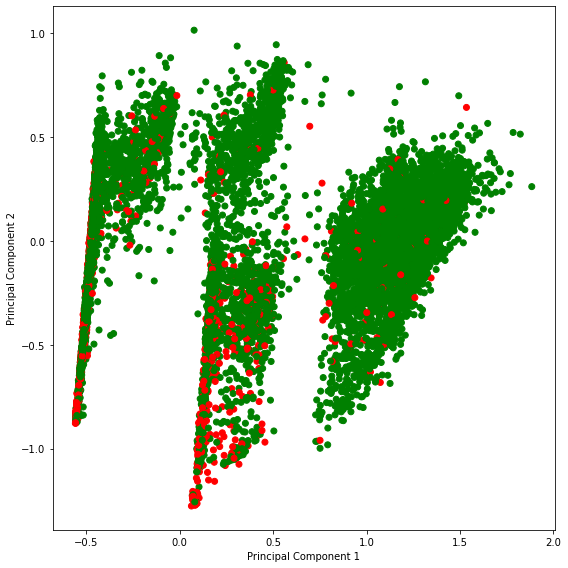

In [180]:
#Before closing, let's also visualize the data to see if we can spot any patterns
%matplotlib inline
fig = plt.figure(figsize = (8,8))
plt.scatter(df_train_pca[:,0], df_train_pca[:,1], c = y_train.map({0:'green',1:'red'}))
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.tight_layout()
plt.show()

In [181]:
## creating confusion matrix for test data
confusion2 = metrics.confusion_matrix(y_pred_2.churn, y_pred_2.final_predicted )
confusion2

array([[8228,    0],
       [ 756,    0]], dtype=int64)

In [182]:
# metrics
# print other metrics

# accuracy
print("accuracy : ", metrics.accuracy_score(y_pred_2.churn, y_pred_2.final_predicted))
# precision
print("precision : ", metrics.precision_score(y_pred_2.churn, y_pred_2.final_predicted))
# recall/sensitivity
print("recall : ", metrics.recall_score(y_pred_2.churn, y_pred_2.final_predicted))

accuracy :  0.9158504007123776
precision :  0.0
recall :  0.0


#### Result : The logistic regression model with PCA after tuning provided the accuracy 91.5% on test data.

## Decision Tree Model

#### Data Preparation for Decision Tree Model

In [183]:
# Putting feature variable to X
X = hvc.drop(['mobile_number','churn'],axis=1)

# Putting response variable to y
y = hvc['churn']

X.head()

,aon,arpu_av_good_phase,arpu_action_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,og_others_av_good_phase,og_others_action_phase,total_og_mou_good_phase,total_og_mou_action_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,ic_others_av_good_phase,ic_others_action_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,total_rech_data_good_phase,total_rech_data_action_phase,max_rech_data_good_phase,max_rech_data_action_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,arpu_3g_av_good_phase,arpu_3g_action_phase,arpu_2g_av_good_phase,arpu_2g_action_phase,night_pck_user_good_phase,night_pck_user_action_phase,monthly_2g_av_good_phase,monthly_2g_action_phase,sachet_2g_av_good_phase,sachet_2g_action_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,fb_user_good_phase,fb_user_action_phase,vbc_av_good_phase,vbc_action_phase
0,968,206,214,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,1,0,5,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,7,2,614,252,252,252,18,8,252,252,18,8,2,1,252,252,0,0,2,1,252,252,16,6,117,110,212,212,212,212,0,0,0,0,0,0,1,1,0,0,1,1,51,30
2,1103,178,210,33,37,182,208,0,0,0,0,18,14,23,38,23,16,68,46,64,68,15,23,55,76,8,23,78,121,0,0,142,97,0,0,568,285,93,67,15,39,111,50,219,156,72,29,111,167,40,43,223,239,890,395,0,0,0,0,2,0,9,2,483,116,200,86,20,14,100,86,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0
7,802,"1,210","3,171",56,52,510,326,25,32,18,38,41,40,378,162,59,53,0,0,478,256,14,12,41,49,13,17,68,78,0,10,2,6,0,0,"1,097",350,45,27,220,121,127,40,392,188,24,30,109,141,43,22,177,194,"1,184",429,0,0,8,32,15,15,10,7,2370,3638,1580,1580,26,26,0,779,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,19,58
9,902,183,170,32,22,59,78,0,0,0,0,32,22,39,35,0,0,0,0,71,57,0,0,20,43,0,0,20,43,0,0,0,0,0,0,182,101,127,50,115,123,0,0,242,173,0,0,56,2,0,0,56,2,631,220,0,0,18,46,0,0,6,5,415,210,154,50,26,29,132,30,0,0,1,0,154,0,1,0,0,0,77,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
13,2607,349,593,305,534,266,482,84,72,22,1,28,36,99,294,2,24,0,0,129,354,266,498,154,157,0,0,420,655,0,1,0,5,0,0,"1,100","1,015",38,53,81,195,2,7,121,255,77,15

In [184]:
# Splitting the data into train and test

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)

#### Creating Decision Tree Model

In [185]:
# Importing decision tree classifier from sklearn library

from sklearn.tree import DecisionTreeClassifier

# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 5 so that we can plot and read the tree.

dt_default = DecisionTreeClassifier(class_weight='balanced',max_depth=5)
dt_default.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', max_depth=5)

In [186]:
# Let's check the evaluation metrics of our default model

# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Making predictions
y_pred= dt_default.predict(X_test)

# Printing classification report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      0.90      0.94      8228
           1       0.44      0.83      0.57       756

    accuracy                           0.90      8984
   macro avg       0.71      0.87      0.76      8984
weighted avg       0.94      0.90      0.91      8984



In [187]:
print(metrics.confusion_matrix(y_test, y_pred))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, y_pred))

# precision
print("precision", metrics.precision_score(y_test, y_pred))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, y_pred))

[[7422  806]
 [ 128  628]]
accuracy 0.8960373998219056
precision 0.43793584379358436
recall 0.8306878306878307


In [188]:
# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO 
from sklearn.tree import export_graphviz
import pydotplus, graphviz

# Putting features
features = list(hvc.columns[1:])
features

['aon',
 'arpu_av_good_phase',
 'arpu_action_phase',
 'onnet_mou_av_good_phase',
 'onnet_mou_action_phase',
 'offnet_mou_av_good_phase',
 'offnet_mou_action_phase',
 'roam_ic_mou_av_good_phase',
 'roam_ic_mou_action_phase',
 'roam_og_mou_av_good_phase',
 'roam_og_mou_action_phase',
 'loc_og_t2t_mou_av_good_phase',
 'loc_og_t2t_mou_action_phase',
 'loc_og_t2m_mou_av_good_phase',
 'loc_og_t2m_mou_action_phase',
 'loc_og_t2f_mou_av_good_phase',
 'loc_og_t2f_mou_action_phase',
 'loc_og_t2c_mou_av_good_phase',
 'loc_og_t2c_mou_action_phase',
 'loc_og_mou_av_good_phase',
 'loc_og_mou_action_phase',
 'std_og_t2t_mou_av_good_phase',
 'std_og_t2t_mou_action_phase',
 'std_og_t2m_mou_av_good_phase',
 'std_og_t2m_mou_action_phase',
 'std_og_t2f_mou_av_good_phase',
 'std_og_t2f_mou_action_phase',
 'std_og_mou_av_good_phase',
 'std_og_mou_action_phase',
 'isd_og_mou_av_good_phase',
 'isd_og_mou_action_phase',
 'spl_og_mou_av_good_phase',
 'spl_og_mou_action_phase',
 'og_others_av_good_phase',
 'og_o

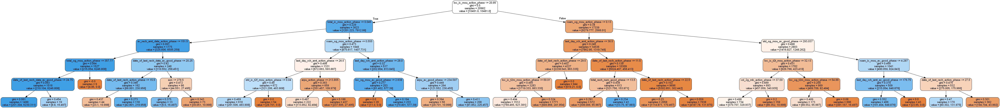

In [189]:
# plotting tree with max_depth=3


dot_data = StringIO()  
export_graphviz(dt_default, out_file=dot_data,feature_names = list(hvc.columns[1:106]) , filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Hyperparameter Tuning

#### Grid Search to Find Optimal Hyperparameters

In [190]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 2),
    'min_samples_leaf': range(50, 250, 50),
    'min_samples_split': range(50, 250, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier(class_weight='balanced')
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          scoring="recall", cv = n_folds, verbose = 1)

# Fit the grid search to the data
grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 160 candidates, totalling 800 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 800 out of 800 | elapsed: 11.4min finished


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(class_weight='balanced'),
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': range(5, 15, 2),
                         'min_samples_leaf': range(50, 250, 50),
                         'min_samples_split': range(50, 250, 50)},
             scoring='recall', verbose=1)

In [191]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,1,0,0,0,entropy,5,50,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",1,1,1,1,1,1,0,156
1,1,0,0,0,entropy,5,50,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",1,1,1,1,1,1,0,150
2,1,0,0,0,entropy,5,50,150,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",1,1,1,1,1,1,0,150
3,1,0,0,0,entropy,5,50,200,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",1,1,1,1,1,1,0,149
4,1,0,0,0,entropy,5,100,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",1,1,1,1,1,1,0,145
5,1,0,0,0,entropy,5,100,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",1,1,1,1,1,1,0,145
6,1,0,0,0,entropy,5,100,150,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",1,1,1,1,1,1,0,145
7,1,0,0,0,entropy,5,100,200,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",1,1,1,1,1,1,0,145
8,1,0,0,0,entropy,5,150,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",1,1,1,1,1,1,0,152
9,1,0,0,0,entropy,5,150,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",1,1,1,1,1,1,0,152


In [192]:
# printing the optimal accuracy score and hyperparameters
print("best recall", grid_search.best_score_)
print(grid_search.best_estimator_)

best recall 0.848369542812384
DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=11, min_samples_leaf=100,
                       min_samples_split=50)


#### Running the model with best prameters obtained from Grid search

In [193]:
# model with optimal hyperparameters
clf_entropy = DecisionTreeClassifier(class_weight='balanced',
                                  criterion='entropy', 
                                  random_state = 100,
                                  max_depth=11, 
                                  min_samples_leaf=100,
                                  min_samples_split=50)
clf_entropy.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=11, min_samples_leaf=100, min_samples_split=50,
                       random_state=100)

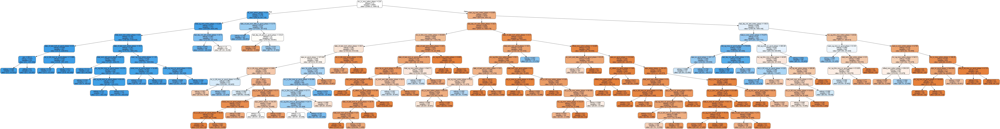

In [194]:
# plotting the tree
dot_data = StringIO()  
export_graphviz(clf_entropy, out_file=dot_data,feature_names=list(hvc.columns[1:106]),filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [195]:
## checking accuracy score
clf_entropy.score(X_test,y_test)

0.8507346393588602

In [196]:
## making predictions
y_pred = clf_entropy.predict(X_test)


print(metrics.confusion_matrix(y_test, y_pred))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, y_pred))

# precision
print("precision", metrics.precision_score(y_test, y_pred))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, y_pred))

[[7000 1228]
 [ 113  643]]
accuracy 0.8507346393588602
precision 0.3436664885088188
recall 0.8505291005291006


#### Result : The Decision Tree model after tuning provided the recall value of 85.05% on test data.

## Random Forest model

#### Data preparation for Random Forest

In [197]:
# Putting feature variable to X
X = hvc.drop(['mobile_number','churn'],axis=1)

# Putting response variable to y
y = hvc['churn']

X.head()

,aon,arpu_av_good_phase,arpu_action_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,og_others_av_good_phase,og_others_action_phase,total_og_mou_good_phase,total_og_mou_action_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,ic_others_av_good_phase,ic_others_action_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,total_rech_data_good_phase,total_rech_data_action_phase,max_rech_data_good_phase,max_rech_data_action_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,arpu_3g_av_good_phase,arpu_3g_action_phase,arpu_2g_av_good_phase,arpu_2g_action_phase,night_pck_user_good_phase,night_pck_user_action_phase,monthly_2g_av_good_phase,monthly_2g_action_phase,sachet_2g_av_good_phase,sachet_2g_action_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,fb_user_good_phase,fb_user_action_phase,vbc_av_good_phase,vbc_action_phase
0,968,206,214,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,1,0,5,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,7,2,614,252,252,252,18,8,252,252,18,8,2,1,252,252,0,0,2,1,252,252,16,6,117,110,212,212,212,212,0,0,0,0,0,0,1,1,0,0,1,1,51,30
2,1103,178,210,33,37,182,208,0,0,0,0,18,14,23,38,23,16,68,46,64,68,15,23,55,76,8,23,78,121,0,0,142,97,0,0,568,285,93,67,15,39,111,50,219,156,72,29,111,167,40,43,223,239,890,395,0,0,0,0,2,0,9,2,483,116,200,86,20,14,100,86,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0
7,802,"1,210","3,171",56,52,510,326,25,32,18,38,41,40,378,162,59,53,0,0,478,256,14,12,41,49,13,17,68,78,0,10,2,6,0,0,"1,097",350,45,27,220,121,127,40,392,188,24,30,109,141,43,22,177,194,"1,184",429,0,0,8,32,15,15,10,7,2370,3638,1580,1580,26,26,0,779,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,19,58
9,902,183,170,32,22,59,78,0,0,0,0,32,22,39,35,0,0,0,0,71,57,0,0,20,43,0,0,20,43,0,0,0,0,0,0,182,101,127,50,115,123,0,0,242,173,0,0,56,2,0,0,56,2,631,220,0,0,18,46,0,0,6,5,415,210,154,50,26,29,132,30,0,0,1,0,154,0,1,0,0,0,77,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
13,2607,349,593,305,534,266,482,84,72,22,1,28,36,99,294,2,24,0,0,129,354,266,498,154,157,0,0,420,655,0,1,0,5,0,0,"1,100","1,015",38,53,81,195,2,7,121,255,77,15

In [198]:
# Splitting the data into train and test

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)

## Creating Random Forest Model

In [199]:
from sklearn.ensemble import RandomForestClassifier

## creating Random Forest ensamble and fitting training data 
rfc = RandomForestClassifier(class_weight='balanced')
rfc.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced')

In [200]:
# Making predictions
predictions = rfc.predict(X_test)

In [201]:
# Let's check the report of our default model
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.96      0.99      0.97      8228
           1       0.79      0.59      0.67       756

    accuracy                           0.95      8984
   macro avg       0.88      0.79      0.82      8984
weighted avg       0.95      0.95      0.95      8984



In [202]:
from sklearn import metrics
print(metrics.confusion_matrix(y_test, predictions))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, predictions))

# precision
print("precision", metrics.precision_score(y_test, predictions))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, predictions))

[[8108  120]
 [ 310  446]]
accuracy 0.9521371326803205
precision 0.7879858657243817
recall 0.58994708994709


### Tuning Hyperparameters

#### Grid Search to Find Optimal Hyperparameters

In [203]:
#specify number of folds for k-fold CV
n_folds = 3

param_grid = {
    'max_depth': [6,8,10],
    'min_samples_leaf': range(100, 400, 200),
    'min_samples_split': range(200, 500, 200),
    'n_estimators': [400,600,800], 
    'max_features': [10,20,30]
}

rf = RandomForestClassifier(class_weight='balanced')


rf = GridSearchCV(estimator = rf, param_grid = param_grid, 
                    cv=n_folds, n_jobs = -1,verbose = 1,
                   scoring="recall")
rf.fit(X_train, y_train)

Fitting 3 folds for each of 108 candidates, totalling 324 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed: 41.7min
[Parallel(n_jobs=-1)]: Done 324 out of 324 | elapsed: 77.9min finished


GridSearchCV(cv=3, estimator=RandomForestClassifier(class_weight='balanced'),
             n_jobs=-1,
             param_grid={'max_depth': [6, 8, 10], 'max_features': [10, 20, 30],
                         'min_samples_leaf': range(100, 400, 200),
                         'min_samples_split': range(200, 500, 200),
                         'n_estimators': [400, 600, 800]},
             scoring='recall', verbose=1)

In [204]:
# printing the optimal recall score and hyperparameters
print('We can get recall of',rf.best_score_,'using',rf.best_params_)

We can get recall of 0.7985283679162746 using {'max_depth': 10, 'max_features': 30, 'min_samples_leaf': 100, 'min_samples_split': 400, 'n_estimators': 800}


In [211]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=10,
                             min_samples_leaf=100, 
                             min_samples_split=400,
                             max_features=30,
                             n_estimators=800,class_weight='balanced')

In [212]:
# fit
rfc.fit(X_train,y_train)

RandomForestClassifier(class_weight='balanced', max_depth=10, max_features=30,
                       min_samples_leaf=100, min_samples_split=400,
                       n_estimators=800)

In [213]:
# predict
predictions = rfc.predict(X_test)

In [214]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.98      0.90      0.94      8228
           1       0.44      0.85      0.58       756

    accuracy                           0.90      8984
   macro avg       0.71      0.87      0.76      8984
weighted avg       0.94      0.90      0.91      8984



In [215]:
print(metrics.confusion_matrix(y_test, predictions))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, predictions))

# precision
print("precision", metrics.precision_score(y_test, predictions))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, predictions))

[[7422  806]
 [ 115  641]]
accuracy 0.8974844167408726
precision 0.4429854872149274
recall 0.8478835978835979


The Random Forest model after tuning provided the recall value of 83.7% on test data.

# Summary

Below tables provides the results for different models:

| Model Name | Consider Class Imbalance | Explains through variables | Recall Score | Precision Score |
| --- | --- | --- | --- | --- |
|Basic Logistic Regression Model using GLM | N | Y | Insignificant | Insignificant |
| Logistic Regression Model with RFE | Y | Y | 0.79 | 0.45 |
| Logistic Regression Model with L1/L2 Regularization | Y | N | 0.33 | 0.70 |
| Decision Tree Model | Y | Y | 0.85 | 0.34 |
| Random Forest Model | Y | N | 0.85 | 0.44 |

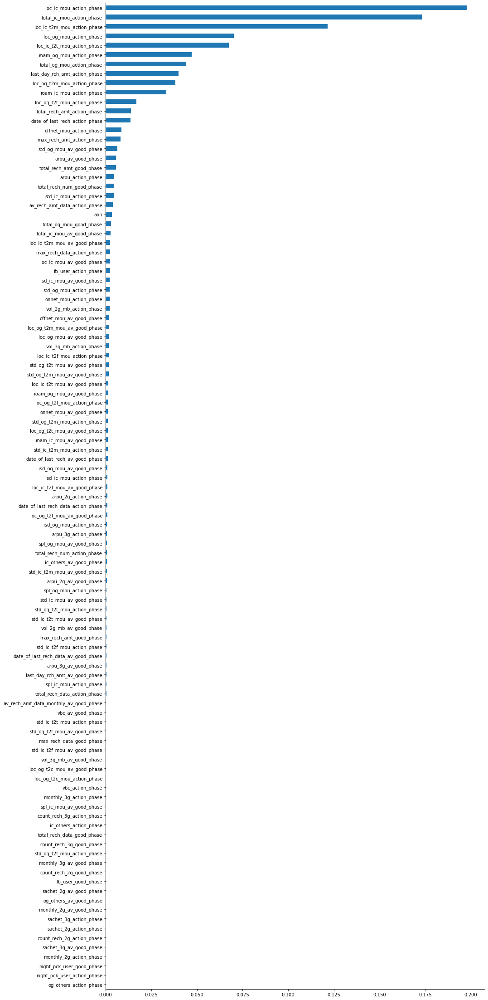

In [216]:


plt.figure(figsize=(15,40))
feat_importances = pd.Series(rfc.feature_importances_, index=X.columns)
feat_importances.nlargest(len(X.columns)).sort_values().plot(kind='barh', align='center')

# Conclusion

Based on the above results, we recommend to use the model for <b>Random Forest</b> both for Prediction and explaination. This model is choosen for following reasons :

- The optimized model provides a good recall score.

- It is easier to understand and explain to the business users.

- It is free from Multicollinearlity issues and even doesn't require any regularization.

# Important churn indicators

- loc_ic_mou_action_phase - Local Incoming Minutes Of Usage in Action Phase

- total_ic_mou_action_phase - Total Incoming Minutes Of Usage in Action Phase

- loc_ic_t2m_mou_action_phase - Local Incoming Operator T to other operator mobile minutes of usage in Action Phase

- loc_og_mou_action_phase - Local Outgoing Minutes Of Usage in Action Phase

- loc_ic_t2t_mou_action_phase - Local Incoming Operator T to T, i.e. within same operator Minutes of Usage in Action Phase

- loc_og_t2m_mou_action_phase - Local Outgoing Operator T to other operator mobile Minutes Of Usage in Action Phase

- total_og_mou_action_phase - Total Outgoing Minutes Of Usage in Action Phase

- roam_og_mou_action_phase - Roaming Outgoing Minutes Of Usage in Action Phase

- last_day_rch_amt_action_phase - Last Day Recharge Amount In Action Phase

- roam_ic_mou_action_phase - Roaming Incoming Minutes Of Usage in Action Phase

- loc_og_t2t_mou_action_phase - Local Outgoing Operator T to T, i.e. within same operator Minutes of Usage in Action Phase

- total_rech_amt_action_phase - Total Recharge Amount In Action Phase

- max_rech_amt_action_phase - Maximum Recharge Amount In Action Phase

Local calls Mou's be it incoming or outgoing have a very important role for churn predictions. Reduction in these KPI's forms a clear indicator of churn.

Overall, drop in any of these indicator KPI is a signal that the customer is not actively engaging in the services offered by the Network operator and thus may choose to churn in the near future.

## Strategies to manage customer churn

It is a fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business goal.

### Monitoring Drop in usage

Customer churn seems to be well predicted by drop in usage.

Aside from using the Machine Learning model for predicting churn, the telecom company should pay close attention to drop in MoU, ARPU and data usage (2g and 3g) month over month. If feasible, the company should track these numbers week over week. Since billing cycles are typically monthly, a drop in usage numbers will give the company time to react when tracked at weekly level.

Contact these customers proactively to find out what's affecting their experience. Perhaps, offer them coupons or other incentives to continue to use the services, while the company fixes the issues reported.

Marketing team must come up with campaigns which targets these high-value to-be churner.